## Machine Learning

### 1.0 Basic process:

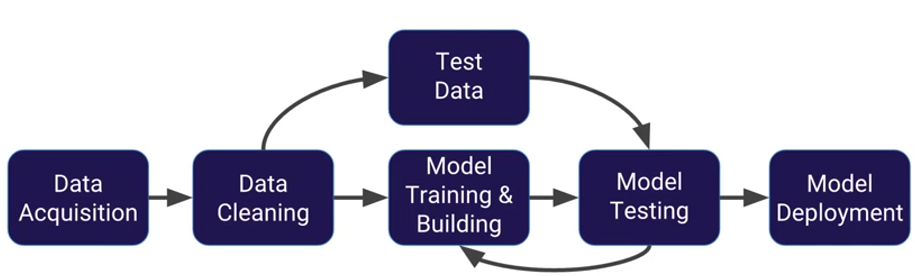

In [1]:
from IPython.display import Image
#This is not required for Choropleth map, but for insert image into this notebook.
Image(filename='Image/process.png')

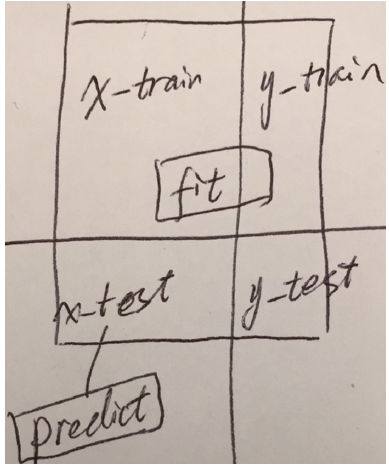

In [7]:
Image(filename='Image/datasplit.png')

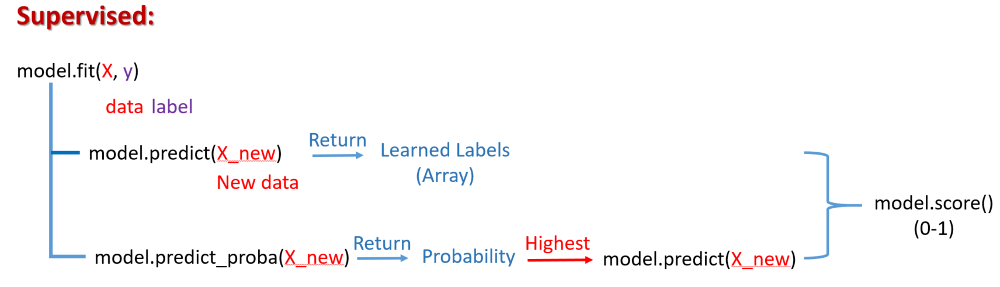

In [8]:
Image(filename='Image/supervised.png')

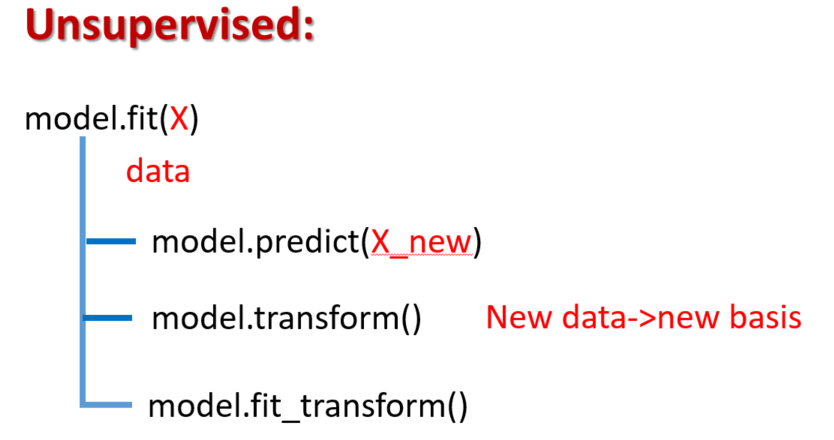

In [9]:
Image(filename='Image/unsupervised.png')

### 1.1 Metrics:
    - Classfication report:
    - Confusion Metrics:

- Classification report:  
F1 score reaches its best value at 1 (perfect precision and recall) and worst at 0.

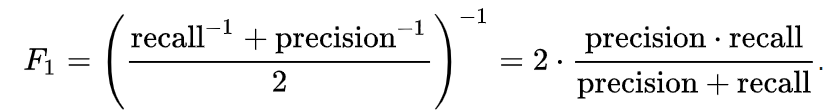

In [126]:
Image(filename='Image/fscore.png')

- Confusion Metrics  
Precision-Recall is a useful measure of success of prediction when the classes are very imbalanced.  
In information retrieval, precision is a measure of result relevancy,   
while recall is a measure of how many truly relevant results are returned.

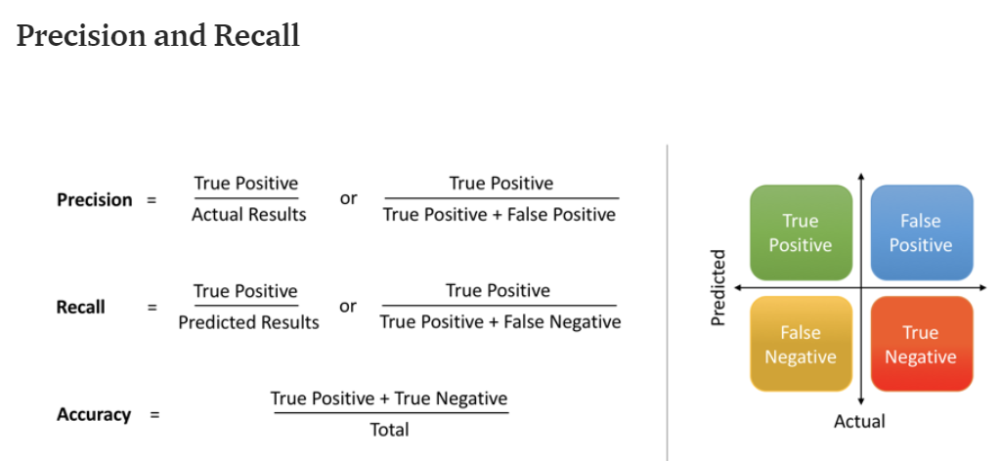

In [125]:
Image(filename='Image/precision.png')

- Note that the precision may not decrease with recall.
- Recall is defined as , where  does not depend on the classifier threshold. This means that lowering the classifier threshold may increase recall, by increasing the number of true positive results. 
- It is also possible that lowering the threshold may leave recall unchanged, while the precision fluctuates.

### 1.2 All Conditions and metrics:

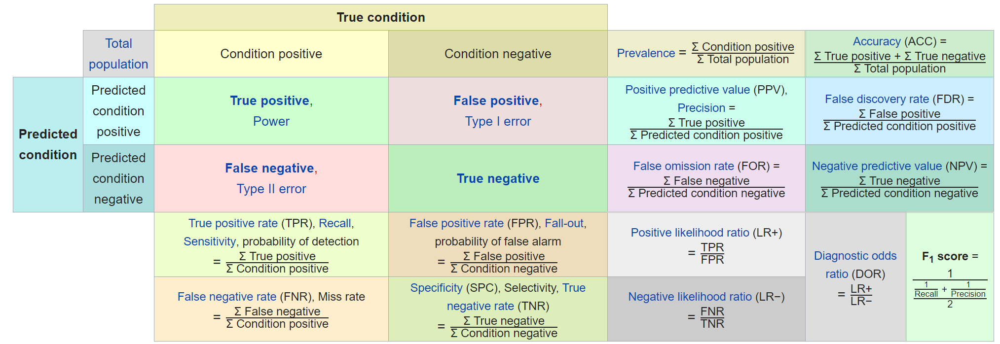

In [127]:
Image(filename='Image/condition.png')

### 2. Linear Regression:

#### 2.0 Introduction:

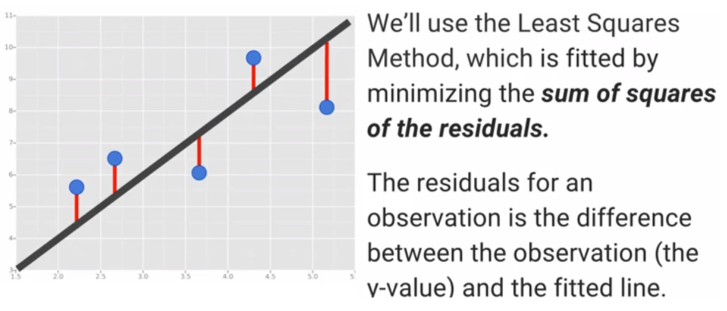

In [10]:
Image(filename='Image/line.png')

#### 2.1 House price prediction:

* Help predicting housing prices for regions in the USA. 
* It would be great if you could somehow create a model for her that allows the agent to put in a few features of a house and returns back an estimate of what the house would sell for.

In [11]:
from sklearn.model_selection import train_test_split

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

c:\python37\lib\importlib\_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)
c:\python37\lib\importlib\_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)
c:\python37\lib\importlib\_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)


In [12]:
df = pd.read_csv("data/USA_Housing.csv")
df.head()

,Avg. Area Income,Avg. Area House Age,Avg. Area Number of Rooms,Avg. Area Number of Bedrooms,Area Population,Price,Address
0,79545.458574,5.682861,7.009188,4.09,23086.800503,1.059034e+06,"208 Michael Ferry Apt. 674\nLaurabury, NE 3701..."
1,79248.642455,6.002900,6.730821,3.09,40173.072174,1.505891e+06,"188 Johnson Views Suite 079\nLake Kathleen, CA..."
2,61287.067179,5.865890,8.512727,5.13,36882.159400,1.058988e+06,"9127 Elizabeth Stravenue\nDanieltown, WI 06482..."
3,63345.240046,7.188236,5.586729,3.26,34310.242831,1.260617e+06,USS Barnett\nFPO AP 44820
4,59982.197226,5.040555,7.839388,4.23,26354.109472,6.309435e+05,USNS Raymond\nFPO AE 09386


In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 7 columns):
Avg. Area Income                5000 non-null float64
Avg. Area House Age             5000 non-null float64
Avg. Area Number of Rooms       5000 non-null float64
Avg. Area Number of Bedrooms    5000 non-null float64
Area Population                 5000 non-null float64
Price                           5000 non-null float64
Address                         5000 non-null object
dtypes: float64(6), object(1)
memory usage: 273.5+ KB


In [14]:
df.describe()

,Avg. Area Income,Avg. Area House Age,Avg. Area Number of Rooms,Avg. Area Number of Bedrooms,Area Population,Price
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5.000000e+03
mean,68583.108984,5.977222,6.987792,3.981330,36163.516039,1.232073e+06
std,10657.991214,0.991456,1.005833,1.234137,9925.650114,3.531176e+05
min,17796.631190,2.644304,3.236194,2.000000,172.610686,1.593866e+04
25%,61480.562388,5.322283,6.299250,3.140000,29403.928702,9.975771e+05
50%,68804.286404,5.970429,7.002902,4.050000,36199.406689,1.232669e+06
75%,75783.338666,6.650808,7.665871,4.490000,42861.290769,1.471210e+06
max,107701.748378,9.519088,10.759588,6.500000,69621.713378,2.469066e+06


In [15]:
df.columns

Index(['Avg. Area Income', 'Avg. Area House Age', 'Avg. Area Number of Rooms',
       'Avg. Area Number of Bedrooms', 'Area Population', 'Price', 'Address'],
      dtype='object')

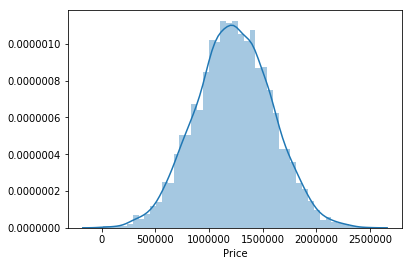

In [16]:
sns.distplot(df['Price'])

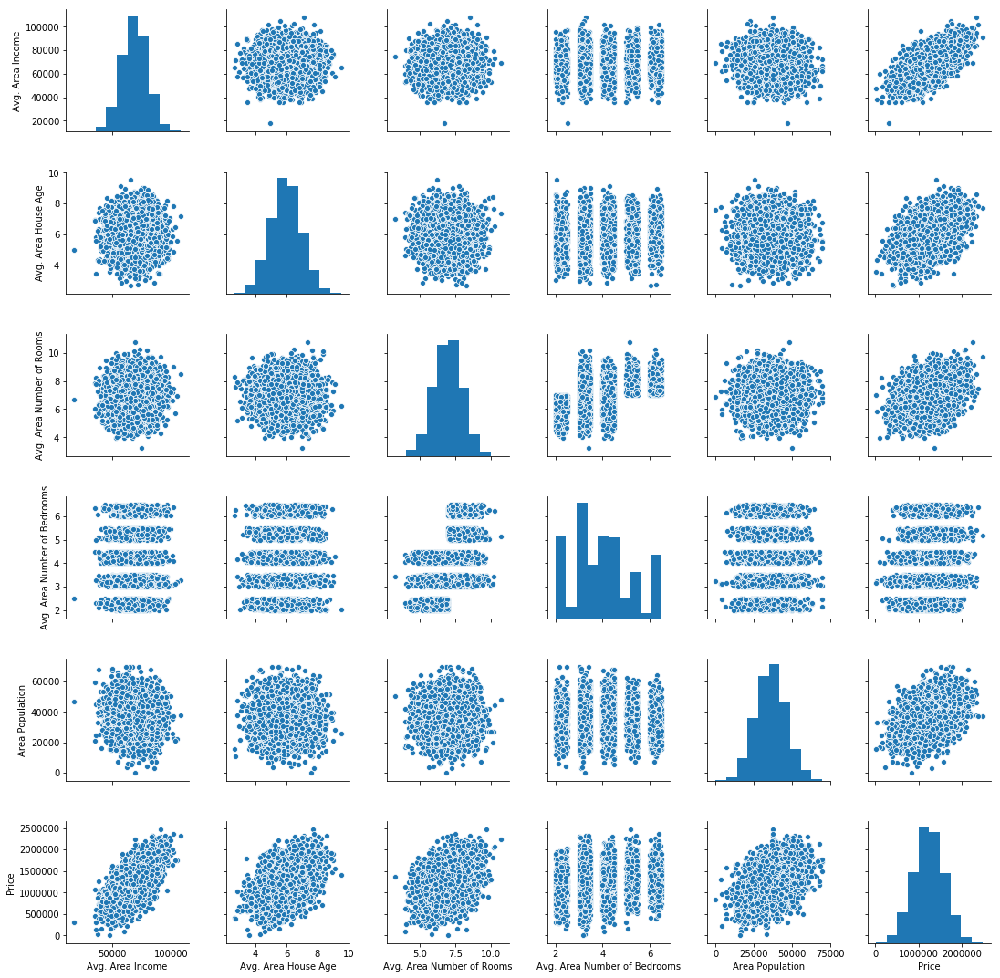

In [17]:
sns.pairplot(df)

In [18]:
df.corr()

,Avg. Area Income,Avg. Area House Age,Avg. Area Number of Rooms,Avg. Area Number of Bedrooms,Area Population,Price
Avg. Area Income,1.000000,-0.002007,-0.011032,0.019788,-0.016234,0.639734
Avg. Area House Age,-0.002007,1.000000,-0.009428,0.006149,-0.018743,0.452543
Avg. Area Number of Rooms,-0.011032,-0.009428,1.000000,0.462695,0.002040,0.335664
Avg. Area Number of Bedrooms,0.019788,0.006149,0.462695,1.000000,-0.022168,0.171071
Area Population,-0.016234,-0.018743,0.002040,-0.022168,1.000000,0.408556
Price,0.639734,0.452543,0.335664,0.171071,0.408556,1.000000


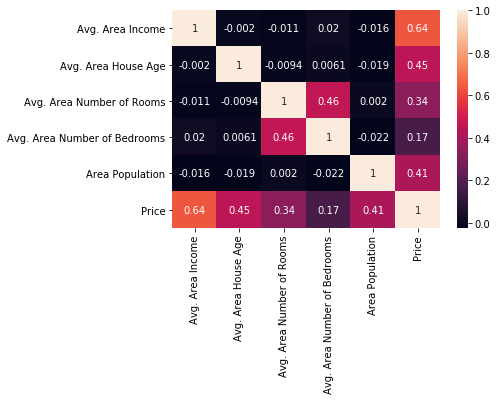

In [19]:
sns.heatmap(df.corr(),annot=True)

#### Train the Linear Model:
* We will need to first split up our data into an X array that contains the features to train on, and a y array with the target variable, in this case the Price column. We will toss out the Address column because it only has text info that the linear regression model can't use.

In [20]:
from sklearn.model_selection import train_test_split

In [21]:
df.columns

Index(['Avg. Area Income', 'Avg. Area House Age', 'Avg. Area Number of Rooms',
       'Avg. Area Number of Bedrooms', 'Area Population', 'Price', 'Address'],
      dtype='object')

In [22]:
X=df[['Avg. Area Income', 'Avg. Area House Age', 'Avg. Area Number of Rooms',
       'Avg. Area Number of Bedrooms', 'Area Population']]

In [23]:
y=df['Price']

#### Split the data:

In [24]:
X_train, X_test, y_train, y_test=train_test_split(X, y, test_size=0.4, random_state=42)

In [25]:
X_train.head()

,Avg. Area Income,Avg. Area House Age,Avg. Area Number of Rooms,Avg. Area Number of Bedrooms,Area Population
4576,76027.944929,5.744456,8.032014,4.23,37462.222834
1088,60945.721799,4.781651,5.628335,3.08,34162.956731
479,71392.473885,3.997533,7.839552,4.26,36009.700337
727,69200.664269,5.609022,6.571302,4.28,31085.323040
3783,66631.108857,6.772022,6.923705,4.47,61361.730477


In [26]:
y_train.head()

4576    1.282365e+06
1088    4.371460e+05
479     8.594280e+05
727     1.150094e+06
3783    1.714266e+06
Name: Price, dtype: float64

#### Creating and Training the Model:

In [27]:
from sklearn.linear_model import LinearRegression

c:\python37\lib\importlib\_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 216, got 192
  return f(*args, **kwds)


In [28]:
lm = LinearRegression()
lm.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
         normalize=False)

#### Model Evaluation:
* Evaluate the model by checking out it's coefficients and how we can interpret them.

In [29]:
print(lm.intercept_)

-2642239.251233943


In [30]:
lm.coef_

array([2.15704132e+01, 1.66552478e+05, 1.19512534e+05, 2.75895188e+03,
       1.52968610e+01])

In [31]:
X.columns

Index(['Avg. Area Income', 'Avg. Area House Age', 'Avg. Area Number of Rooms',
       'Avg. Area Number of Bedrooms', 'Area Population'],
      dtype='object')

In [32]:
cdf=pd.DataFrame(lm.coef_, X.columns, columns=['Coeff'])
cdf

,Coeff
Avg. Area Income,21.570413
Avg. Area House Age,166552.477670
Avg. Area Number of Rooms,119512.534382
Avg. Area Number of Bedrooms,2758.951878
Area Population,15.296861


Interpreting the coefficients:

- Holding all other features fixed, a 1 unit increase in **Avg. Area Income** is associated with an **increase of \$21.52 **.
- Holding all other features fixed, a 1 unit increase in **Avg. Area House Age** is associated with an **increase of \$164883.28 **.
- Holding all other features fixed, a 1 unit increase in **Avg. Area Number of Rooms** is associated with an **increase of \$122368.67 **.
- Holding all other features fixed, a 1 unit increase in **Avg. Area Number of Bedrooms** is associated with an **increase of \$2233.80 **.
- Holding all other features fixed, a 1 unit increase in **Area Population** is associated with an **increase of \$15.15 **.

Does this make sense? Probably not because I made up this data. If you want real data to repeat this sort of analysis, check out the [boston dataset](http://scikit-learn.org/stable/modules/generated/sklearn.datasets.load_boston.html):



#####  using regression.coef_ does get the corresponding coefficients to the features, 
##### i.e. regression.coef_[0] corresponds to "feature1" and regression.coef_[1] corresponds to "feature2". This should be what you desire.

### 2.2 Boston House price prediction:

**2.2.0 Data Loading:**

In [33]:
from sklearn.datasets import load_boston

c:\python37\lib\importlib\_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 216, got 192
  return f(*args, **kwds)


In [34]:
boston = load_boston()

In [35]:
boston.keys()

dict_keys(['data', 'target', 'feature_names', 'DESCR', 'filename'])

In [36]:
boston['DESCR']

".. _boston_dataset:\n\nBoston house prices dataset\n---------------------------\n\n**Data Set Characteristics:**  \n\n    :Number of Instances: 506 \n\n    :Number of Attributes: 13 numeric/categorical predictive. Median Value (attribute 14) is usually the target.\n\n    :Attribute Information (in order):\n        - CRIM     per capita crime rate by town\n        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.\n        - INDUS    proportion of non-retail business acres per town\n        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)\n        - NOX      nitric oxides concentration (parts per 10 million)\n        - RM       average number of rooms per dwelling\n        - AGE      proportion of owner-occupied units built prior to 1940\n        - DIS      weighted distances to five Boston employment centres\n        - RAD      index of accessibility to radial highways\n        - TAX      full-value property-tax rate per $10,000

In [37]:
boston['feature_names']

array(['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD',
       'TAX', 'PTRATIO', 'B', 'LSTAT'], dtype='<U7')

In [38]:
type(boston)

sklearn.utils.Bunch

- Bunch: 
- Dictionary-like object that exposes its keys as attributes.
- the interesting attributes are: ‘data’, the data to learn, ‘target’, the classification labels, ‘target_names’, the meaning of the labels, ‘feature_names’, the meaning of the features, ‘DESCR’, the full description of the dataset, ‘filename’, the physical location of iris csv dataset (added in version 0.20).

In [39]:
boston_df=boston.data # Convert Bunch to DataFrame.
type(boston_df)

numpy.ndarray

In [40]:
X_train.head()

,Avg. Area Income,Avg. Area House Age,Avg. Area Number of Rooms,Avg. Area Number of Bedrooms,Area Population
4576,76027.944929,5.744456,8.032014,4.23,37462.222834
1088,60945.721799,4.781651,5.628335,3.08,34162.956731
479,71392.473885,3.997533,7.839552,4.26,36009.700337
727,69200.664269,5.609022,6.571302,4.28,31085.323040
3783,66631.108857,6.772022,6.923705,4.47,61361.730477


In [41]:
y_train.head() #Price

4576    1.282365e+06
1088    4.371460e+05
479     8.594280e+05
727     1.150094e+06
3783    1.714266e+06
Name: Price, dtype: float64

**2.2.1 Prediction with model:**
* Let's grab predictions off our test set and see how well it did!

In [42]:
lm=LinearRegression()
lm.fit(X_train, y_train) # Training data, Target value.

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
         normalize=False)

- Based on the model trained, we got the predicted price on X_test prediction.

In [43]:
prediction=lm.predict(X_test)
prediction

array([1311074.5919504 , 1239575.75693439, 1243916.2545076 , ...,
        840825.86587568, 1050491.02276049,  946720.46738543])

#### 2.2.2 Evaluate the prediction:
- scatter: plt.scatter(y_test, prediction)
- Distribution: sns.distplot(y_test-prediction)
- Regression Evaluation Metrics: MAE, MSE, RMSE

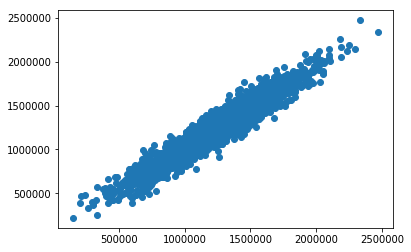

In [44]:
# I. scatter: plt.scatter(y_test, prediction)
plt.scatter(y_test, prediction)
# Check how the real y_test price matches the prediction.

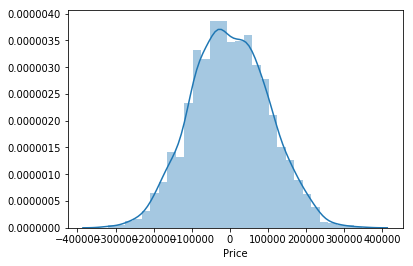

In [45]:
# II. Distribution: sns.distplot(y_test-prediction)
sns.distplot(y_test-prediction)

#### III. Regression Evaluation Metrics


Here are three common evaluation metrics for regression problems:

- Mean Absolute Error** (MAE) is the mean of the absolute value of the errors:

$$\frac 1n\sum_{i=1}^n|y_i-\hat{y}_i|$$

- Mean Squared Error** (MSE) is the mean of the squared errors:

$$\frac 1n\sum_{i=1}^n(y_i-\hat{y}_i)^2$$

- Root Mean Squared Error** (RMSE) is the square root of the mean of the squared errors:

$$\sqrt{\frac 1n\sum_{i=1}^n(y_i-\hat{y}_i)^2}$$

Comparing these metrics:

- **MAE** is the easiest to understand, because it's the average error.
- **MSE** is more popular than MAE, because MSE "punishes" larger errors, which tends to be useful in the real world.
- **RMSE** is even more popular than MSE, because RMSE is interpretable in the "y" units.

All of these are **loss functions**, because we want to minimize them.

https://heartbeat.fritz.ai/5-regression-loss-functions-all-machine-learners-should-know-4fb140e9d4b0
<img src='Image/loss.png'>

In [46]:
from sklearn import metrics

In [47]:
metrics.mean_absolute_error(y_test, prediction)

81331.22699573077

In [48]:
metrics.mean_squared_error(y_test, prediction)

10119734875.652187

In [49]:
np.sqrt(metrics.mean_squared_error(y_test, prediction))

100596.89297215987

### 3. Bias Variance Trade-Off
- Understand the model performance;
- Adding noise by adding model complexity(flexibility)
- The model after bias variance trade-off will begin to over-fit.

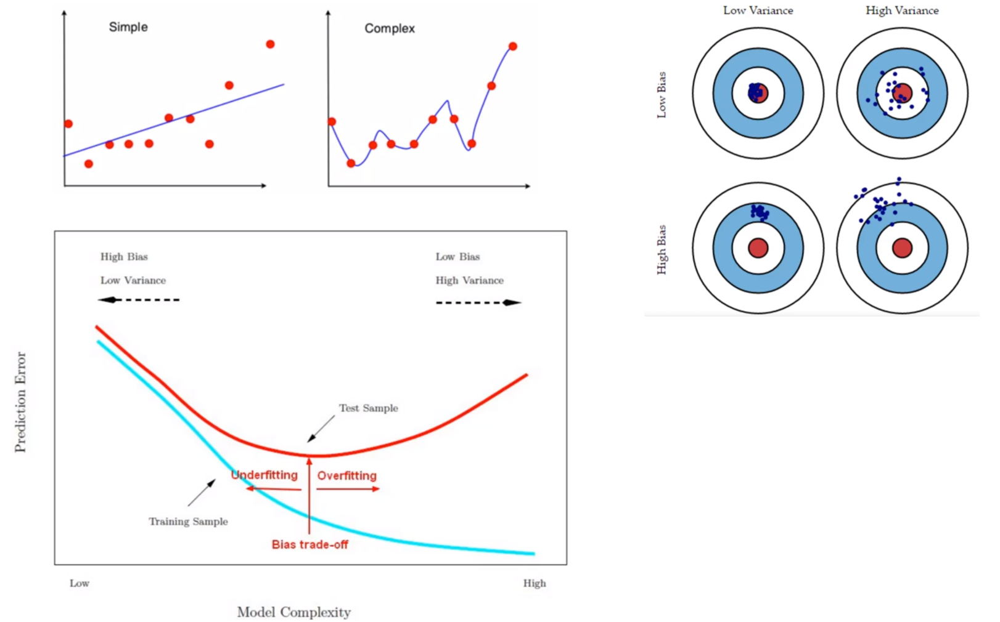

In [50]:
Image(filename='Image/variance.png')

### 4. Classification:

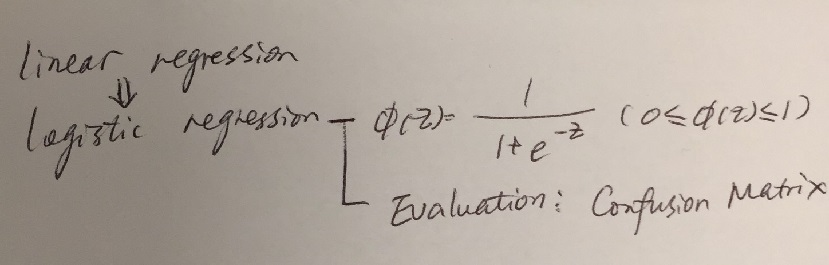

In [51]:
Image(filename='Image/logistic3.jpg')

#### 4.1 Logistic Regression:

* The results in a probability from 0-1 of belonging in the 1 class.
* We can set a cutoff point at 0.5, anything below it results in class 0, above is class 1. We use the logistic function to output a value ranging from 0-1.
* Logistic regression is the appropriate regression analysis to conduct when the dependent variable is dichotomous (binary). 
* Logistic Regression is a Machine Learning classification algorithm that is used to predict the probability of a categorical dependent variable, one of the most popular ways to fit models for categorical data, especially for binary response data in Data Modeling.
* Unlike linear regression, logistic regression can directly predict probabilities (values that are restricted to the (0,1) interval);


- E.g.: need to classify whether an email is spam or not. If we use linear regression for this problem, there is a need for setting up a threshold based on which classification can be done. Say if the actual class is malignant, predicted continuous value 0.4 and the threshold value is 0.5, the data point will be classified as not malignant which can lead to serious consequence in real time.

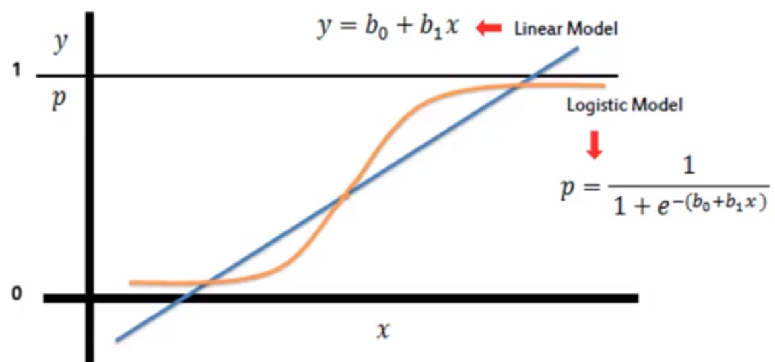

In [52]:
Image(filename='Image/logistic.png')

**In the logistic regression the constant (b0) moves the curve left and right and the slope (b1) defines the steepness of the curve. Logistic regression can handle any number of numerical and/or categorical variables.**

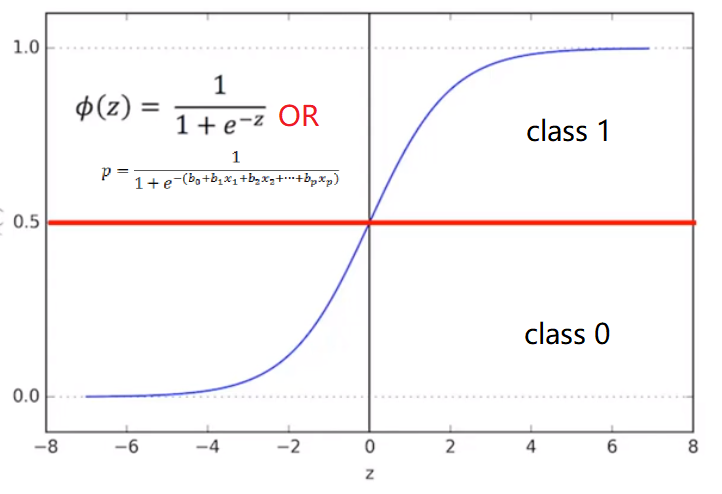

In [53]:
Image(filename='Image/logistic2.png')

#### 4.2 Logistic Regression Evaluation:
* Confusion Metrics:

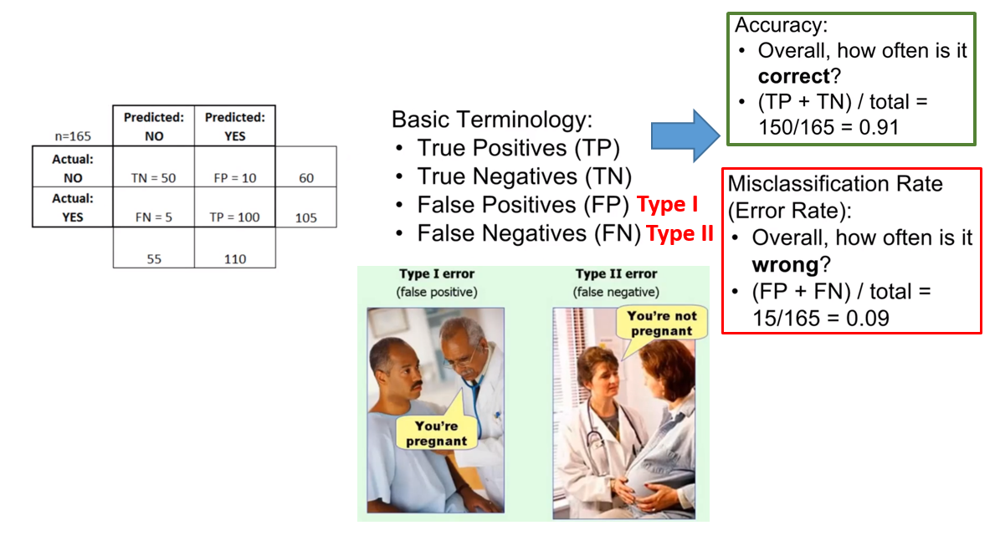

In [54]:
Image(filename='Image/Confusedmatrix.png')

### 5. KNN:

#### When use KNN?

* 1. Data is noise free and small;
* 2. LAZY learner;

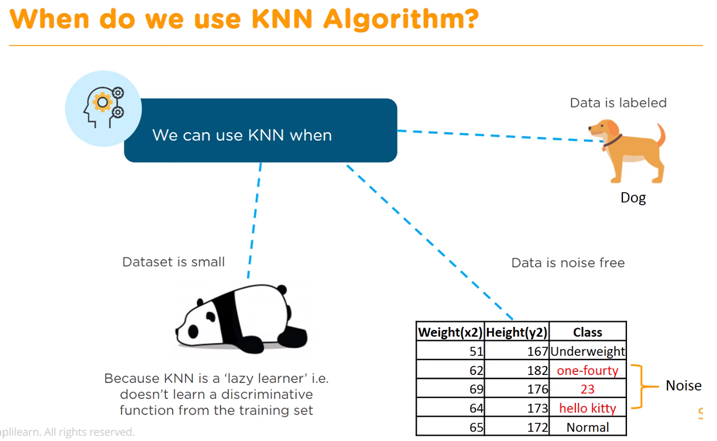

In [55]:
Image(filename='Image/knnwhen.png')

#### How KNN works?

* Calculate Euclidean distance of unknown data point from all the points in the dataset

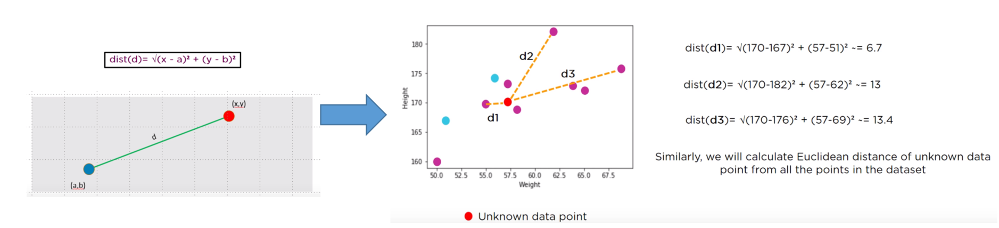

In [56]:
Image(filename='Image/knnwork.png')

#### KNN Example:

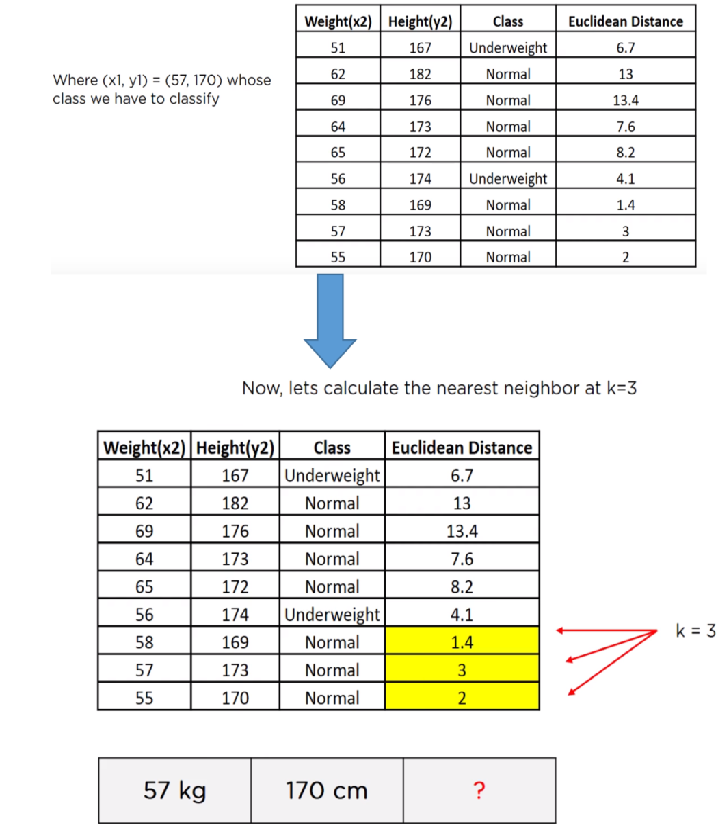

In [57]:
Image(filename='Image/knneg.png')

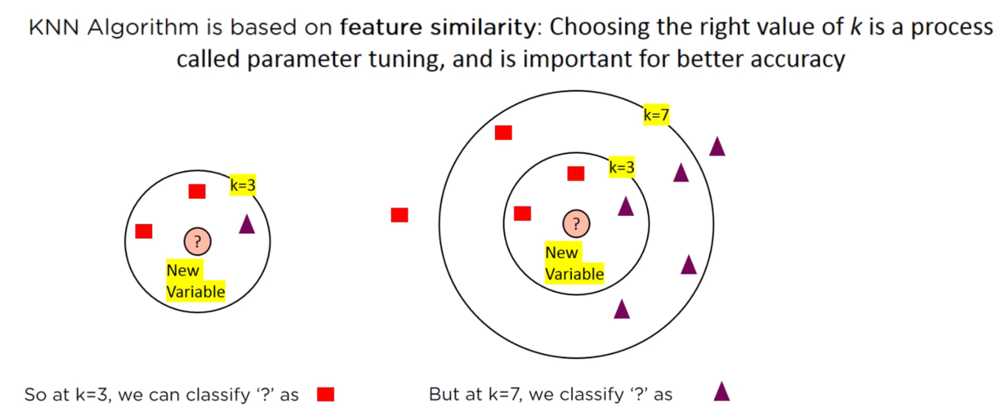

In [58]:
Image(filename='Image/kvalues.png')

**If knn=1, we only use the nearest neighbor to define the category.  
  If knn=11, we use the 11 nearest neighbor to define the category.**

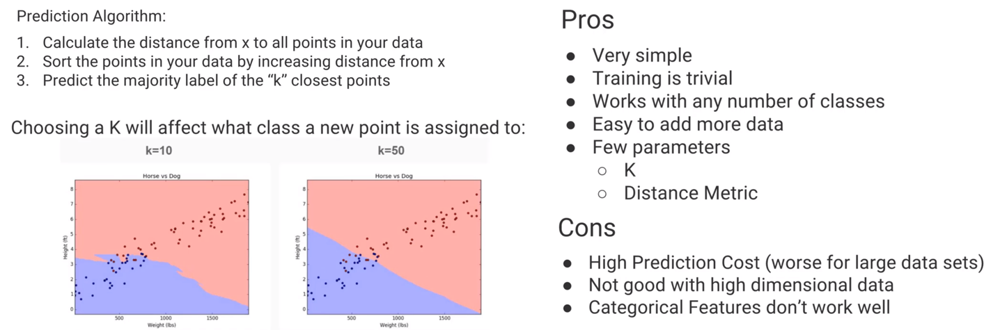

In [59]:
Image(filename='Image/knn.png')

#### How to pick k?

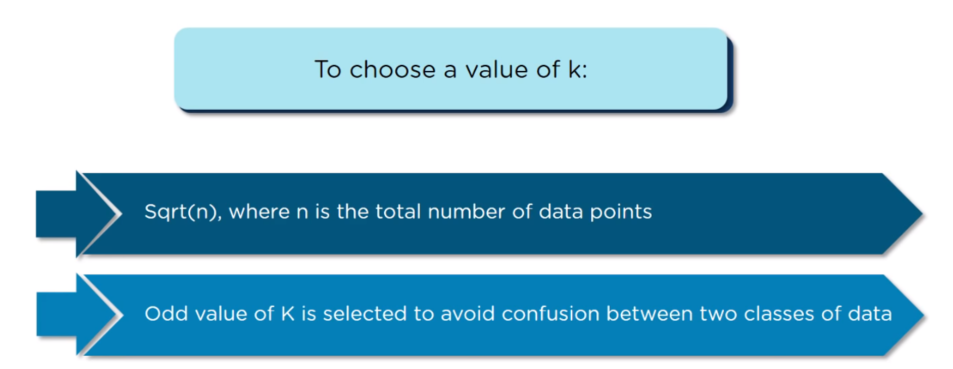

In [60]:
Image(filename='Image/kvaluechoose.png')

**Pros and Cons:**

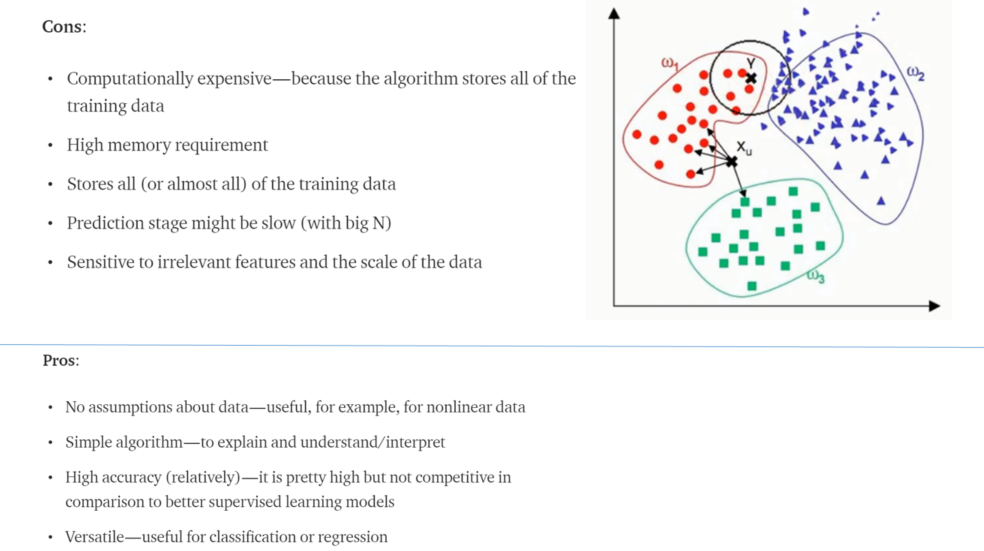

In [189]:
Image(filename='Image/knn4.png')

#### 5.1 KNN Sample for unknown features prediction:
- In this case, You've been given a classified data set from a company! They've hidden the feature column names but have given you the data and the target classes. 

- We'll try to use KNN to create a model that directly predicts a class for a new data point based off of the features.


In [61]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

#### 5.1.0 Read data:

In [62]:
df=pd.read_csv("data/Classified Data.csv")

In [63]:
df.head()

,Unnamed: 0,WTT,PTI,EQW,SBI,LQE,QWG,FDJ,PJF,HQE,NXJ,TARGET CLASS
0,0,0.913917,1.162073,0.567946,0.755464,0.780862,0.352608,0.759697,0.643798,0.879422,1.231409,1
1,1,0.635632,1.003722,0.535342,0.825645,0.924109,0.648450,0.675334,1.013546,0.621552,1.492702,0
2,2,0.721360,1.201493,0.921990,0.855595,1.526629,0.720781,1.626351,1.154483,0.957877,1.285597,0
3,3,1.234204,1.386726,0.653046,0.825624,1.142504,0.875128,1.409708,1.380003,1.522692,1.153093,1
4,4,1.279491,0.949750,0.627280,0.668976,1.232537,0.703727,1.115596,0.646691,1.463812,1.419167,1


##### 5.1.1 The mechanics of preprocessing: scaling and centering:  
* 1. Before running a model, such as regression (predicting a continuous variable) or classification (predicting a discrete variable), on data, you almost always want to do some preprocessing.  
* 2. For numerical variables, it is common to either normalize or standardize your data.

#### Why Scale & Center?-For improvement!
##### The two main reasons for scaling your data are:

* 1. Your predictor variables may have significantly different ranges and, in certain situations, such as when implementing k-NN, this needs to be mitigated so that certain features do not dominate the algorithm;
* 2. You want your features to be unit-independent, that is, not reliant on the scale of the measurement involved: for example, you could have a measured feature expressed in meters and I could have the same feature expressed in centimeters. If we both scale our respective data, this feature will be the same for each of us.

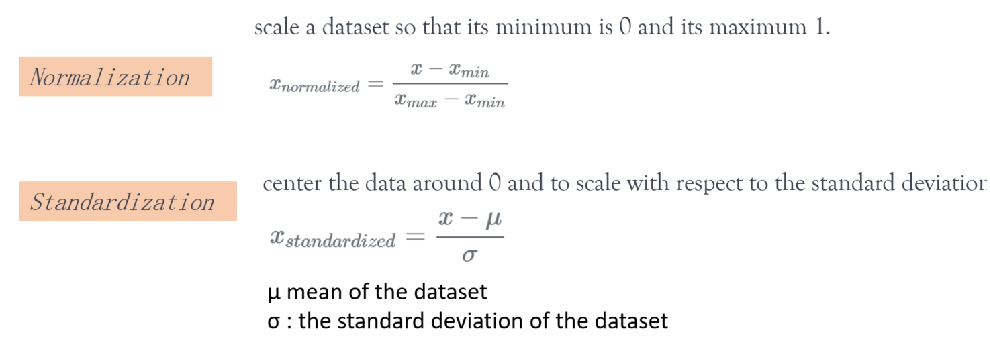

In [64]:
Image(filename='Image/knnnormal.png')

#### In another picture:
**2 kinds of normalization:**

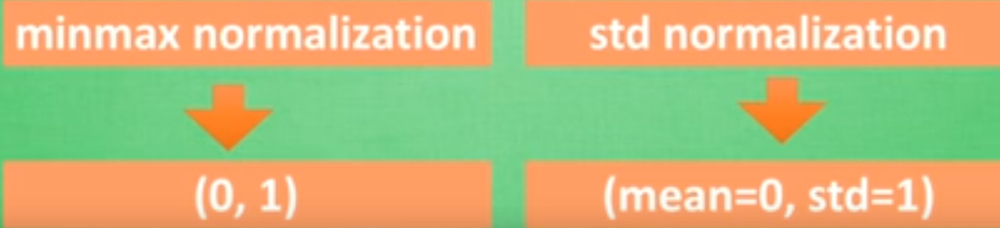

In [65]:
Image(filename='Image/standard.png')

In [66]:
from sklearn.preprocessing import StandardScaler

In [67]:
# Apply scaler to all features except target class.
scaler=StandardScaler() #sklearn.preprocessing.data.StandardScaler
scaler.fit(df.drop('TARGET CLASS', axis=1))

c:\python37\lib\site-packages\sklearn\preprocessing\data.py:625: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)


StandardScaler(copy=True, with_mean=True, with_std=True)

In [68]:
scales_features=scaler.transform(df.drop('TARGET CLASS',axis=1))

c:\python37\lib\site-packages\ipykernel_launcher.py:1: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  """Entry point for launching an IPython kernel.


In [69]:
type(scales_features)

numpy.ndarray

In [70]:
scales_features

array([[-1.73031962, -0.12354188,  0.18590747, ..., -1.48236813,
        -0.9497194 , -0.64331425],
       [-1.72685552, -1.08483602, -0.43034845, ..., -0.20224031,
        -1.82805088,  0.63675862],
       [-1.72339142, -0.78870217,  0.33931821, ...,  0.28570652,
        -0.68249379, -0.37784986],
       ...,
       [ 1.72339142,  0.64177714, -0.51308341, ..., -2.36249443,
        -0.81426092,  0.11159651],
       [ 1.72685552,  0.46707241, -0.98278576, ..., -0.03677699,
         0.40602453, -0.85567   ],
       [ 1.73031962, -0.38765353, -0.59589427, ..., -0.56778932,
         0.3369971 ,  0.01034996]])

In [71]:
# Re-assign the columns names for scales_features (Except the column name 'Target class':
df_feat = pd.DataFrame(scales_features, columns=df.columns[:-1])
df_feat.head()

,Unnamed: 0,WTT,PTI,EQW,SBI,LQE,QWG,FDJ,PJF,HQE,NXJ
0,-1.730320,-0.123542,0.185907,-0.913431,0.319629,-1.033637,-2.308375,-0.798951,-1.482368,-0.949719,-0.643314
1,-1.726856,-1.084836,-0.430348,-1.025313,0.625388,-0.444847,-1.152706,-1.129797,-0.202240,-1.828051,0.636759
2,-1.723391,-0.788702,0.339318,0.301511,0.755873,2.031693,-0.870156,2.599818,0.285707,-0.682494,-0.377850
3,-1.719927,0.982841,1.060193,-0.621399,0.625299,0.452820,-0.267220,1.750208,1.066491,1.241325,-1.026987
4,-1.716463,1.139275,-0.640392,-0.709819,-0.057175,0.822886,-0.936773,0.596782,-1.472352,1.040772,0.276510


#### 5.1.2 Data Split for training & testing:

In [72]:
from sklearn.model_selection import train_test_split

In [73]:
X=df_feat
y=df['TARGET CLASS']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

In [74]:
X_train.head()

,Unnamed: 0,WTT,PTI,EQW,SBI,LQE,QWG,FDJ,PJF,HQE,NXJ
290,-0.725730,-0.865812,-0.426085,-0.098704,-0.358143,-0.090834,-1.445613,0.943619,-0.711715,-1.416361,1.335201
167,-1.151814,-0.289633,0.427599,-0.324566,-0.291304,-1.047206,-0.847424,0.309935,-2.102427,-1.071680,0.809926
486,-0.046765,-1.628411,0.840546,1.164633,-0.985219,0.346949,-0.064661,1.008390,-0.184080,0.865138,-0.630975
683,0.635663,-0.576123,-0.157888,0.102529,1.176857,-2.475351,-0.599677,-0.249565,0.262795,0.598726,1.376306
876,1.304235,0.059207,1.006760,1.932615,2.225987,-0.570004,0.634646,2.427879,1.136821,0.104758,-0.175808


In [75]:
y_train.head()

290    0
167    1
486    0
683    1
876    0
Name: TARGET CLASS, dtype: int64

#### 5.1.3 Train KNN model:(For testing: K=1)

In [76]:
from sklearn.neighbors import KNeighborsClassifier

In [77]:
knn=KNeighborsClassifier(n_neighbors=1)

In [78]:
knn.fit(X_train, y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=None, n_neighbors=1, p=2,
           weights='uniform')

#### 5.1.4 Predict by KNN model:

In [79]:
pred = knn.predict(X_test)

#### 5.1.5 Evaluation:

In [80]:
from sklearn.metrics import classification_report, confusion_matrix

In [81]:
print(classification_report(y_test, pred))

              precision    recall  f1-score   support

           0       0.92      0.91      0.92       159
           1       0.90      0.91      0.91       141

   micro avg       0.91      0.91      0.91       300
   macro avg       0.91      0.91      0.91       300
weighted avg       0.91      0.91      0.91       300



In [82]:
print(confusion_matrix(y_test, pred))

[[145  14]
 [ 12 129]]


In [83]:
(y_test!=pred).head()

545    False
298    False
109    False
837     True
194    False
Name: TARGET CLASS, dtype: bool

In [84]:
np.mean(y_test!=pred)

0.08666666666666667

### 5.2 How to pick the better K?

- K: odd number for voting.
- Figure out the K nearest points to the unknown point for classification.(Distance computation)
- Finally, vote to classify the unknown point.

#### 5.2.1 Define the iteration to test every k:

In [85]:
error_rate=[]

for i in range(1,40):
    knn=KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train, y_train)
    pred_i=knn.predict(X_test)
    error_rate.append(np.mean(y_test!=pred_i))

In [86]:
error_rate[:5]

[0.08666666666666667, 0.09, 0.07666666666666666, 0.07333333333333333, 0.08]

#### 5.2.2 Plot the k & error value:

Text(0, 0.5, 'Error Rate')

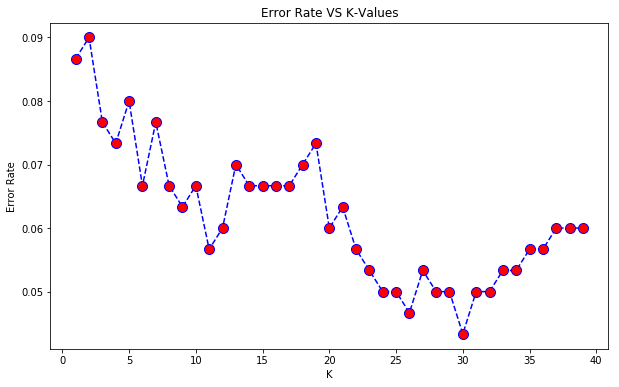

In [87]:
plt.figure(figsize=(10,6))
plt.plot(range(1,40), error_rate, color='blue', linestyle='dashed', marker='o', markerfacecolor='red', markersize=10)

plt.title("Error Rate VS K-Values")
plt.xlabel('K')
plt.ylabel('Error Rate')

Here we can see that that after arouns K>23 the error rate just tends to hover around 0.06-0.05 Let's retrain the model with that and check the classification report!

#### 5.2.3 Re-train with new specific K:

In [88]:
knn=KNeighborsClassifier(n_neighbors=23)
knn.fit(X_train, y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=None, n_neighbors=23, p=2,
           weights='uniform')

In [89]:
pred = knn.predict(X_test)

In [90]:
print(classification_report(y_test, pred))

              precision    recall  f1-score   support

           0       0.94      0.96      0.95       159
           1       0.95      0.94      0.94       141

   micro avg       0.95      0.95      0.95       300
   macro avg       0.95      0.95      0.95       300
weighted avg       0.95      0.95      0.95       300



In [91]:
print(confusion_matrix(y_test, pred))

[[152   7]
 [  9 132]]


### 6. Tree:

#### 6.1 Decision Tree:
    

- Could be for regression and classification, BOTH

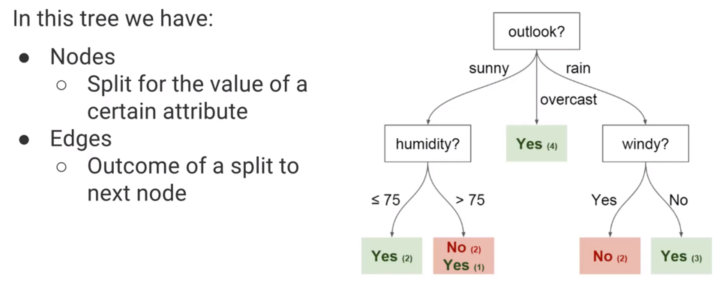

In [92]:
Image(filename='Image/decisiont.png')

- The orders of features filtering:  
Entropy is a measure of disorder, an indicator of how messy your data is.
- In decision trees, the goal is to tidy the data. 
 You maximize the purity of the groups as much as possible each time you create a new node of the tree (meaning you cut your set in two).

#### E.g.: This case is going to predict the kyphosis.

In [93]:
df_ky=pd.read_csv("Data/kyphosis.csv")
df_ky.head()

,Kyphosis,Age,Number,Start
0,absent,71,3,5
1,absent,158,3,14
2,present,128,4,5
3,absent,2,5,1
4,absent,1,4,15


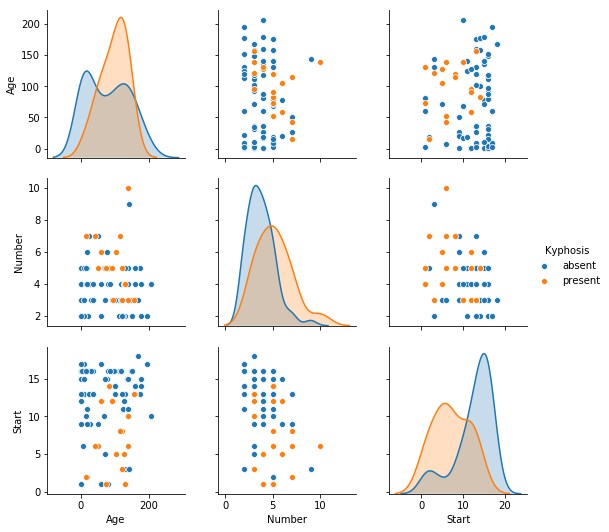

In [94]:
sns.pairplot(df_ky, hue="Kyphosis")

##### Get the X, y and split:

In [95]:
X=df_ky.drop('Kyphosis', axis=1)
y=df_ky['Kyphosis']

In [96]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=101)

##### Train by Decision Tree:

In [97]:
from sklearn.tree import DecisionTreeClassifier

In [98]:
dtc=DecisionTreeClassifier()
dtc.fit(X_train, y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

##### Predict by the decision tree trained:

In [99]:
pred_ky=dtc.predict(X_test)

##### Evaluation:

In [100]:
print(confusion_matrix(y_test, pred_ky))

[[12  5]
 [ 6  2]]


In [101]:
print(classification_report(y_test, pred_ky))

              precision    recall  f1-score   support

      absent       0.67      0.71      0.69        17
     present       0.29      0.25      0.27         8

   micro avg       0.56      0.56      0.56        25
   macro avg       0.48      0.48      0.48        25
weighted avg       0.54      0.56      0.55        25



#### Tree Visualization

Scikit learn actually has some built-in visualization capabilities for decision trees, you won't use this often and it requires you to install the pydot library, but here is an example of what it looks like and the code to execute this:

- Structure 

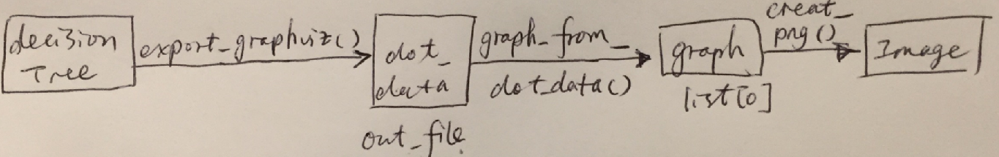

In [121]:
Image(filename='Image/dtview.png')

In [109]:
from IPython.display import Image
from sklearn.externals.six import StringIO
from sklearn.tree import export_graphviz
import pydot

In [111]:
features=list(df_ky.columns[1:])
features

['Age', 'Number', 'Start']

Export a decision tree in DOT format, 
This function generates a GraphViz representation of the decision tree, which is then written into out_file. Once exported, graphical renderings can be generated using

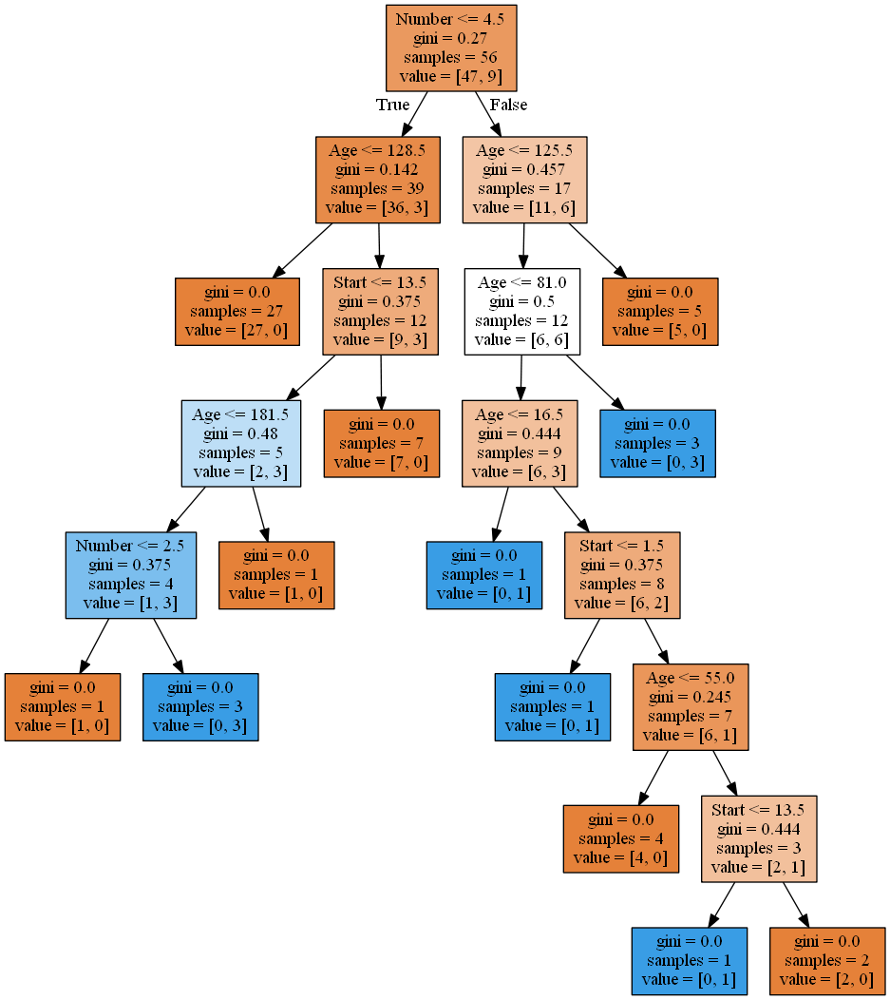

In [122]:
dot_data=StringIO()
export_graphviz(dtc, out_file=dot_data, feature_names=features, filled=True) #,rounded=True
graph=pydot.graph_from_dot_data(dot_data.getvalue()) # list type of graph.
Image(graph[0].create_png())

#### 6.2 Random Forrest:

- "Random": random dataset with specific portion, random features selections with specific numbers.  
- Could be for regression and classification, BOTH
#### 1. Bootstrap: With replacement;
#### 2. Bagging:



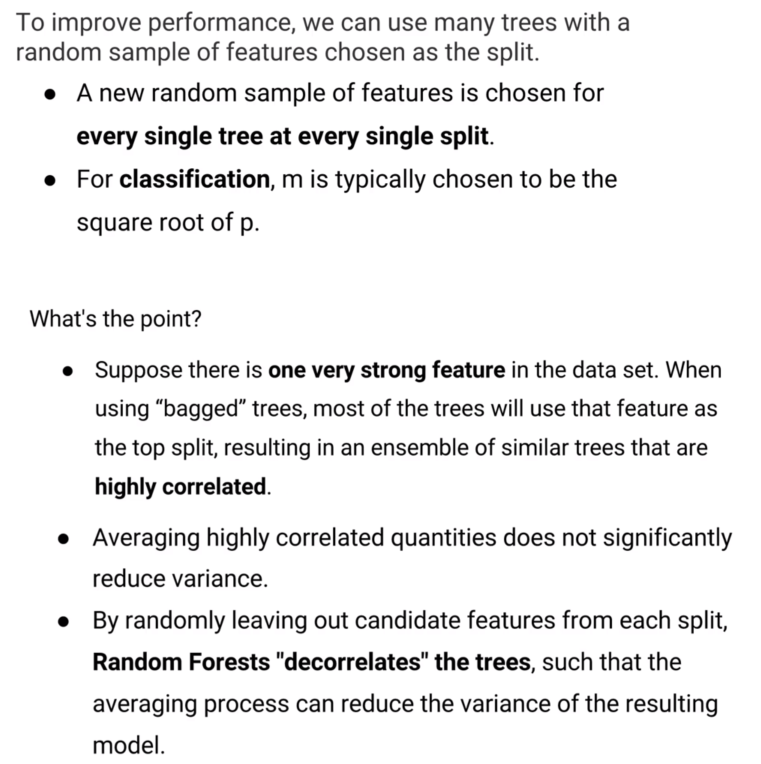

In [128]:
Image(filename='Image/dt.png')

In [103]:
from sklearn.ensemble import RandomForestClassifier

c:\python37\lib\importlib\_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 216, got 192
  return f(*args, **kwds)


In [104]:
rfc=RandomForestClassifier(n_estimators=200)

In [105]:
rfc.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=200, n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [106]:
rfc_pred=rfc.predict(X_test)

In [107]:
print(classification_report(y_test, rfc_pred))

              precision    recall  f1-score   support

      absent       0.74      1.00      0.85        17
     present       1.00      0.25      0.40         8

   micro avg       0.76      0.76      0.76        25
   macro avg       0.87      0.62      0.62        25
weighted avg       0.82      0.76      0.71        25



In [108]:
print(confusion_matrix(y_test, rfc_pred))

[[17  0]
 [ 6  2]]


### 7. SVM

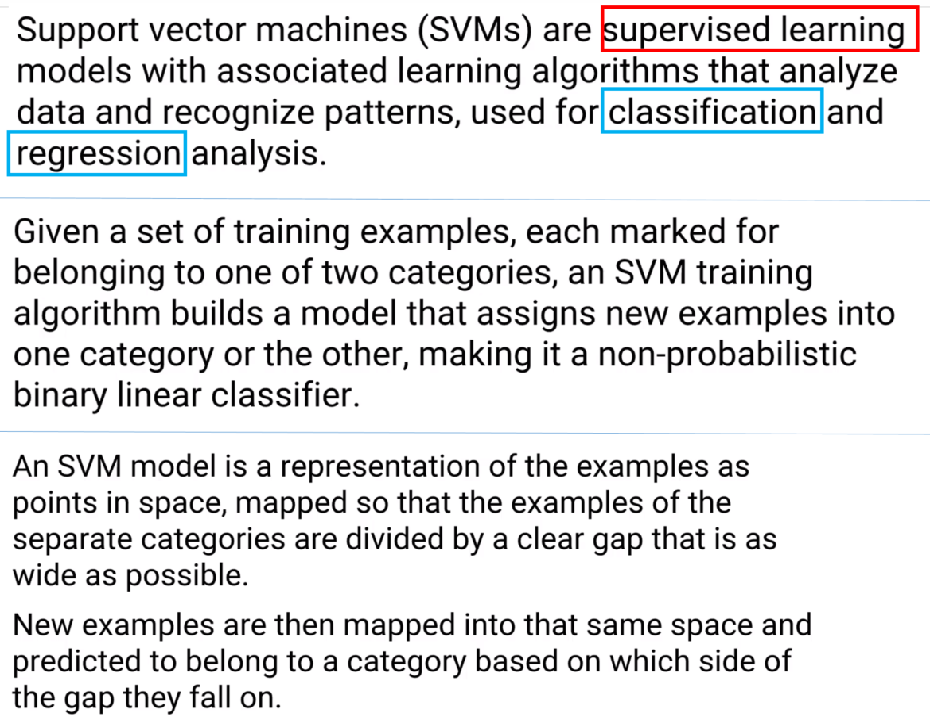

In [131]:
Image(filename='Image/svm1.png')

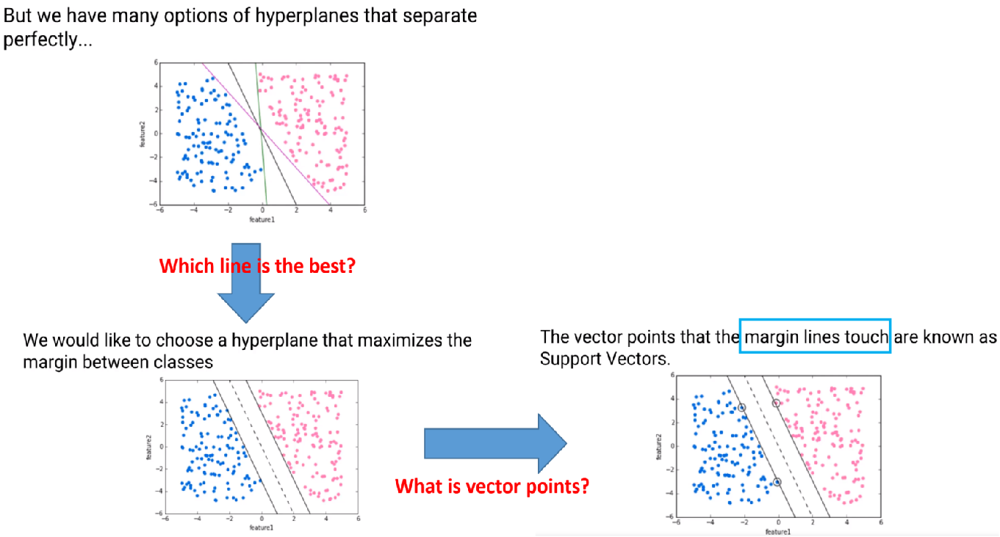

In [132]:
Image(filename='Image/svm2.png')

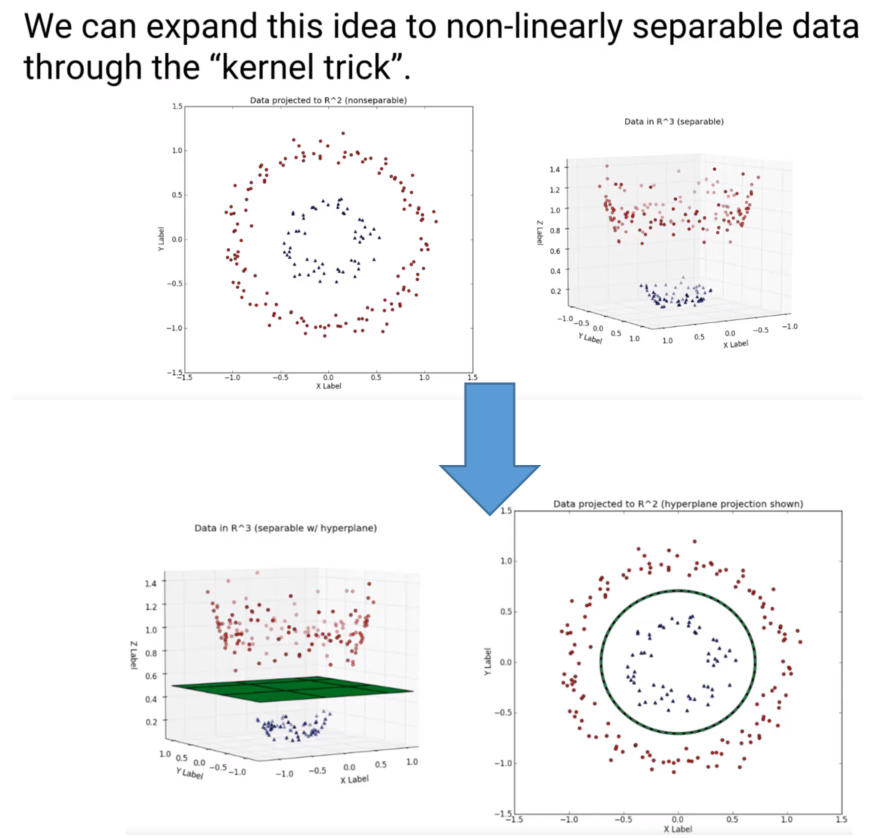

In [134]:
Image(filename='Image/svm3.png')

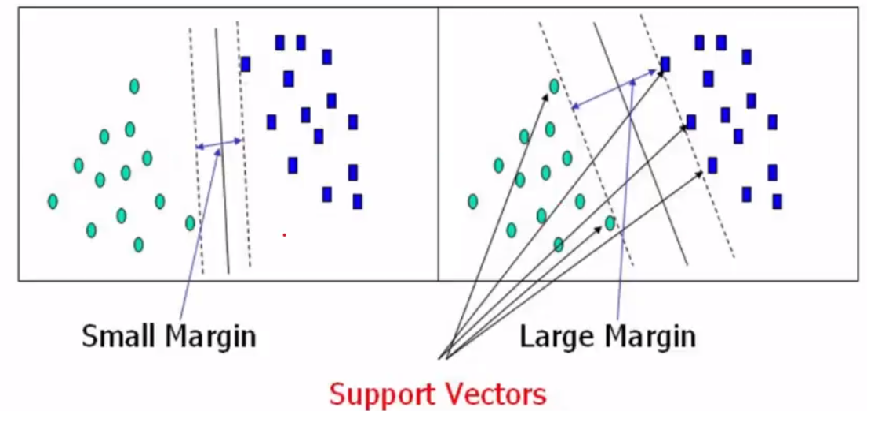

In [179]:
Image(filename='Image/svm4.png')

- We are looking for the vector which makes the border area FATTEST!

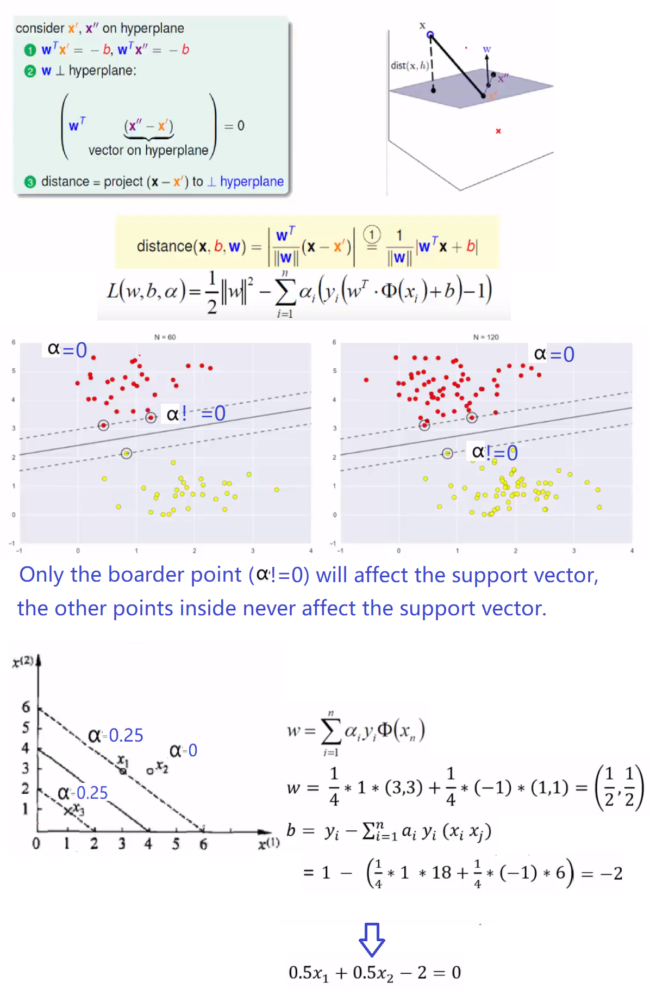

In [181]:
Image(filename='Image/svm5.png')

### 7.1 Cancer exercise:

In [135]:
from sklearn.datasets import load_breast_cancer

In [141]:
cancer=load_breast_cancer()
cancer.keys()

dict_keys(['data', 'target', 'target_names', 'DESCR', 'feature_names', 'filename'])

In [138]:
print(cancer['DESCR']) # Check the description of the built-in datsets.

.. _breast_cancer_dataset:

Breast cancer wisconsin (diagnostic) dataset
--------------------------------------------

**Data Set Characteristics:**

    :Number of Instances: 569

    :Number of Attributes: 30 numeric, predictive attributes and the class

    :Attribute Information:
        - radius (mean of distances from center to points on the perimeter)
        - texture (standard deviation of gray-scale values)
        - perimeter
        - area
        - smoothness (local variation in radius lengths)
        - compactness (perimeter^2 / area - 1.0)
        - concavity (severity of concave portions of the contour)
        - concave points (number of concave portions of the contour)
        - symmetry 
        - fractal dimension ("coastline approximation" - 1)

        The mean, standard error, and "worst" or largest (mean of the three
        largest values) of these features were computed for each image,
        resulting in 30 features.  For instance, field 3 is Mean Radius, f

In [143]:
df_dfeat=pd.DataFrame(cancer['data'], columns=cancer['feature_names'])

- datasets split:

In [142]:
from sklearn.model_selection import train_test_split

In [144]:
X=df_dfeat
y=cancer['target']

In [145]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

- Train the SVS & Evaluation:

In [150]:
from sklearn.svm import SVC # C-Support Vector Classification.
model=SVC()
model.fit(X_train, y_train)

c:\python37\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
  kernel='rbf', max_iter=-1, probability=False, random_state=None,
  shrinking=True, tol=0.001, verbose=False)

In [152]:
pred=model.predict(X_test)

In [153]:
print(confusion_matrix(y_test, pred))

[[  0  67]
 [  0 121]]


In [154]:
print(classification_report(y_test,pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        67
           1       0.64      1.00      0.78       121

   micro avg       0.64      0.64      0.64       188
   macro avg       0.32      0.50      0.39       188
weighted avg       0.41      0.64      0.50       188



c:\python37\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


#### Gridsearch

Finding the right parameters (like what C or gamma values to use) is a tricky task!  
But luckily, we can be a little lazy and just try a bunch of combinations and see what works best!  
This idea of creating a 'grid' of parameters and just trying out all the possible combinations is called a Gridsearch, this method is common enough that Scikit-learn has this functionality built in with *GridSearchCV*!  
The CV stands for cross-validation which is the

GridSearchCV takes a dictionary that describes the parameters that should be tried and a model to train.  
The grid of parameters is defined as a dictionary, where the keys are the parameters and the values are the settings to be tested. 

In [157]:
from sklearn.model_selection import GridSearchCV

In [158]:
param_grid={'C':[0.1,1,10,100], 'gamma':[1,0.1,0.01,0.001]}

In [171]:
grid=GridSearchCV(SVC(), param_grid, verbose=5) #verbose: Controls the verbosity: the higher, the more messages/detail you will get

In [172]:
grid.fit(X_train, y_train)

c:\python37\lib\site-packages\sklearn\model_selection\_split.py:2053: FutureWarning: You should specify a value for 'cv' instead of relying on the default value. The default value will change from 3 to 5 in version 0.22.
  warnings.warn(CV_WARNING, FutureWarning)
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Fitting 3 folds for each of 16 candidates, totalling 48 fits
[CV] C=0.1, gamma=1 ..................................................
[CV] .................. C=0.1, gamma=1, score=0.6171875, total=   0.0s
[CV] C=0.1, gamma=1 ..................................................
[CV] ......... C=0.1, gamma=1, score=0.6220472440944882, total=   0.0s
[CV] C=0.1, gamma=1 ..................................................
[CV] ......... C=0.1, gamma=1, score=0.6190476190476191, total=   0.0s
[CV] C=0.1, gamma=0.1 ................................................
[CV] ................ C=0.1, gamma=0.1, score=0.6171875, total=   0.0s
[CV] C=0.1, gamma=0.1 ................................................
[CV] ....... C=0.1, gamma=0.1, score=0.6220472440944882, total=   0.0s
[CV] C=0.1, gamma=0.1 ................................................
[CV] ....... C=0.1, gamma=0.1, score=0.6190476190476191, total=   0.0s
[CV] C=0.1, gamma=0.01 ...............................................
[CV] ...........

[Parallel(n_jobs=1)]: Done  48 out of  48 | elapsed:    1.1s finished


GridSearchCV(cv='warn', error_score='raise-deprecating',
       estimator=SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
  kernel='rbf', max_iter=-1, probability=False, random_state=None,
  shrinking=True, tol=0.001, verbose=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'C': [0.1, 1, 10, 100], 'gamma': [1, 0.1, 0.01, 0.001]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=5)

- Get the best pair:

In [173]:
grid.best_params_ 

{'C': 1, 'gamma': 0.001}

In [174]:
grid.best_estimator_

SVC(C=1, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma=0.001, kernel='rbf',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)

In [177]:
grid_predictions = grid.predict(X_test)

In [178]:
print(confusion_matrix(y_test, grid_predictions))
print('\n')
print(classification_report(y_test, grid_predictions))

[[ 65   2]
 [ 13 108]]


              precision    recall  f1-score   support

           0       0.83      0.97      0.90        67
           1       0.98      0.89      0.94       121

   micro avg       0.92      0.92      0.92       188
   macro avg       0.91      0.93      0.92       188
weighted avg       0.93      0.92      0.92       188



### 8.K-means

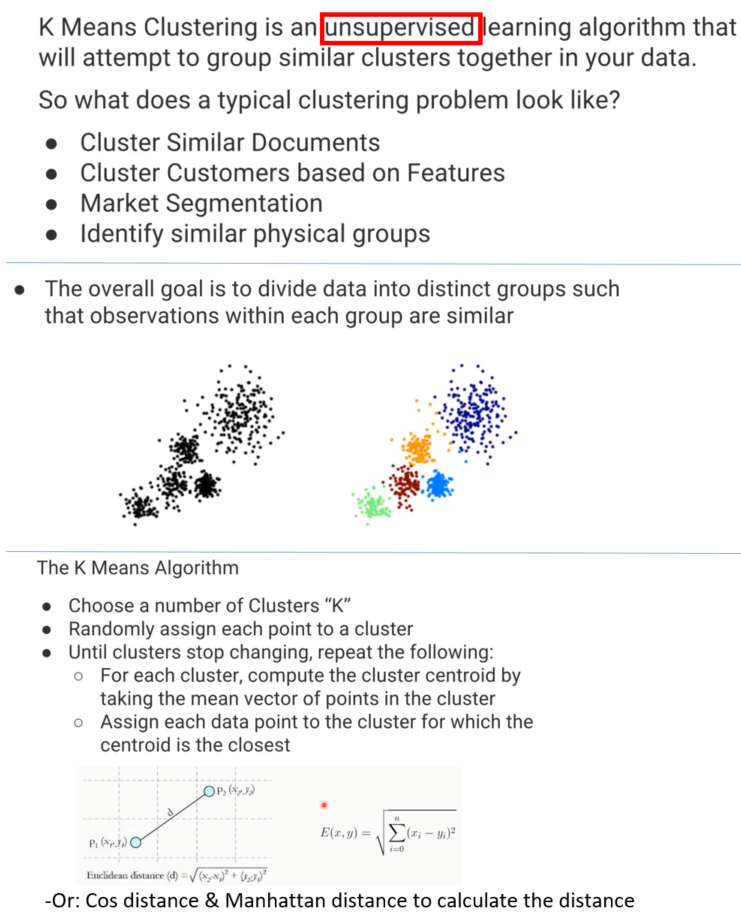

In [190]:
Image(filename='Image/knn1.png')

- About centroid:  
1. The mean of all the points(x,y) in the according cluster.
2. The goal: Make the distance from the unknown point(x,y) to the centroid of some clusters to be MIN.

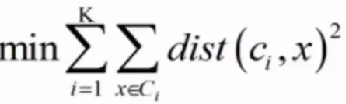

In [192]:
Image(filename='Image/knn0.png')
#This is the distance from the unknown point(x,y) to the centroid of some clusters.

#### How K-means works?

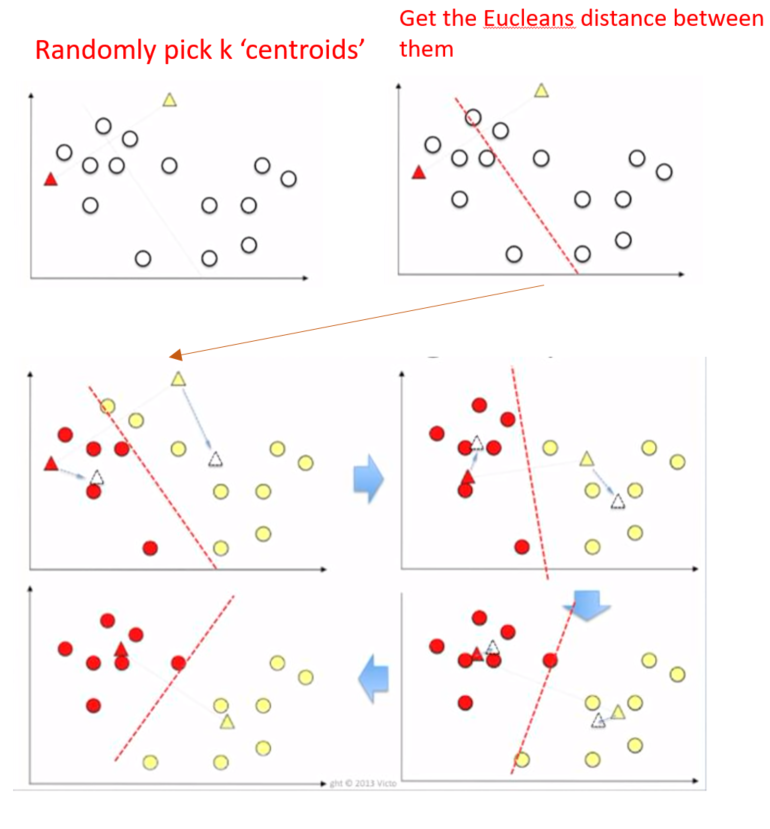

In [193]:
Image(filename='Image/knn5.png')

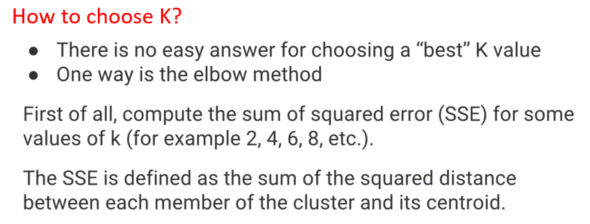

In [186]:
Image(filename='Image/knn2.png')

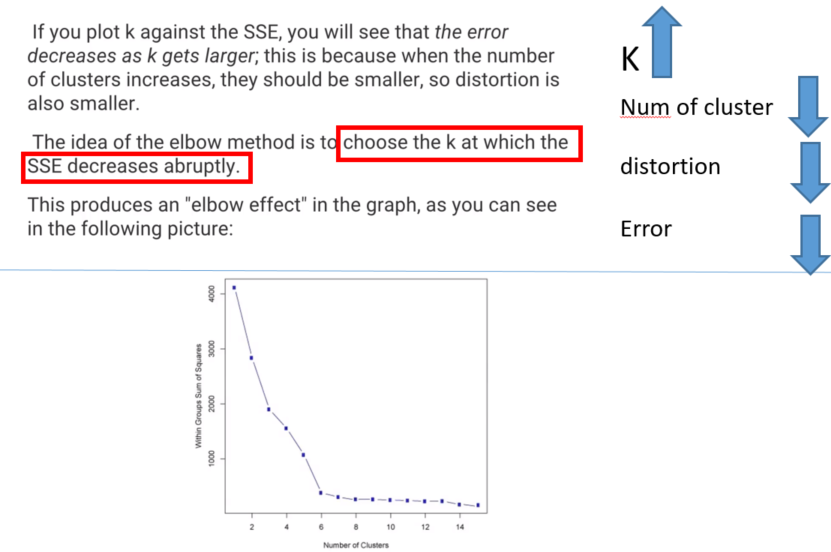

In [196]:
Image(filename='Image/knn3.png')

#### 8.1 K-Means Example:

- This data generated is fake, basically the real situation will not conclude the data with labels, so that we could not compare with the real labels.  
- The K-Means is **an unsupervised** methods.

In [195]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

In [197]:
from sklearn.datasets import make_blobs
#make_blobs: Generate blobs of points with a Gaussian distribution.

- The scikit-learn Python library provides a suite of functions for generating samples from configurable test problems for regression and classification.

In [198]:
data=make_blobs(n_samples=200, n_features=2, centers=4, cluster_std=1.8, random_state=101)

In [203]:
# data generated is a tuple: ((DATA_X, DATA_y), (classification))

In [204]:
#If we need data--read data[0] from tuple:
data[0].shape # 200 samples with 2 features.

(200, 2)

In [210]:
data

(array([[-6.42884095e+00,  1.01411174e+01],
        [ 5.86867888e+00,  5.20110356e+00],
        [-3.76109375e-01,  3.26427943e+00],
        [ 2.16679181e+00,  9.56300522e+00],
        [ 5.09508570e+00,  7.20752718e+00],
        [-1.08788882e+01, -6.11318040e+00],
        [ 2.03405554e+00,  9.76664755e+00],
        [-1.71798771e+00,  1.41401140e+00],
        [ 1.16911341e+00,  8.24556988e+00],
        [-1.35185444e+00,  3.13245345e+00],
        [-6.18548214e+00,  9.67406555e+00],
        [-1.19856602e+00,  2.50408937e+00],
        [ 2.90296863e+00,  7.91251003e+00],
        [ 2.39250023e+00,  5.38173971e+00],
        [-5.27545147e+00,  9.63836659e+00],
        [-5.66814687e-01,  5.60262755e-02],
        [ 5.97336628e+00,  5.87172022e+00],
        [-2.31355268e+00,  5.23980092e-01],
        [-1.01344756e+01, -3.43130837e+00],
        [-4.54082629e+00,  1.13920174e+01],
        [-1.04155833e+01, -5.67545836e+00],
        [ 6.64796693e-01,  9.42304718e-02],
        [ 2.11460477e+00,  3.559

**Check the plot of the data generated:**

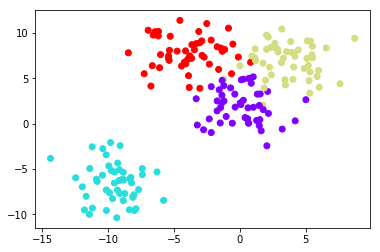

In [207]:
plt.scatter(data[0][:,0], data[0][:,1], c=data[1], cmap='rainbow')

**K-means fit:**

In [212]:
from sklearn.cluster import KMeans

In [213]:
kmeans=KMeans(n_clusters=4)

In [214]:
kmeans.fit(data[0])

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=4, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [215]:
#Check the cluster centroid & labels:
kmeans.cluster_centers_

array([[-4.13591321,  7.95389851],
       [-9.46941837, -6.56081545],
       [ 3.71749226,  7.01388735],
       [-0.0123077 ,  2.13407664]])

In [216]:
kmeans.labels_

array([0, 2, 3, 2, 2, 1, 2, 3, 2, 3, 0, 3, 2, 2, 0, 3, 2, 3, 1, 0, 1, 3,
       3, 1, 0, 1, 1, 3, 2, 2, 0, 1, 2, 3, 3, 0, 1, 1, 1, 3, 1, 0, 0, 0,
       3, 2, 0, 3, 1, 3, 3, 0, 2, 3, 1, 0, 3, 3, 0, 2, 1, 2, 1, 0, 2, 3,
       1, 2, 2, 1, 2, 3, 1, 3, 1, 2, 2, 3, 0, 3, 3, 1, 2, 1, 3, 3, 3, 0,
       3, 1, 1, 1, 1, 3, 3, 1, 2, 0, 1, 2, 3, 1, 3, 3, 2, 3, 1, 2, 1, 1,
       2, 0, 0, 2, 1, 2, 0, 0, 2, 0, 3, 0, 3, 0, 3, 2, 0, 3, 1, 0, 0, 0,
       3, 1, 1, 0, 2, 0, 2, 3, 1, 2, 1, 0, 0, 2, 3, 1, 0, 0, 0, 0, 3, 2,
       3, 0, 2, 2, 2, 3, 2, 3, 3, 0, 1, 0, 3, 2, 0, 3, 2, 3, 0, 2, 3, 0,
       2, 2, 1, 2, 0, 1, 1, 0, 1, 1, 1, 1, 1, 3, 1, 2, 2, 0, 1, 3, 2, 2,
       1, 3])

**Compare with original ones:**

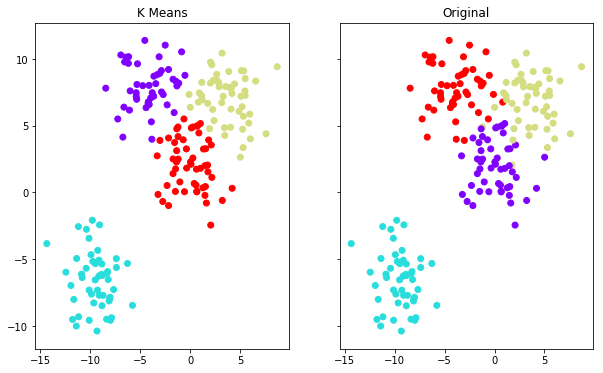

In [219]:
fig,(ax1, ax2)=plt.subplots(1,2, sharey=True, figsize=(10,6))
ax1.set_title('K Means')
ax2.set_title('Original')

ax1.scatter(data[0][:,0], data[0][:,1], c=kmeans.labels_, cmap='rainbow')
ax2.scatter(data[0][:,0], data[0][:,1], c=data[1], cmap='rainbow')

- **Standardization:**  
 Sometimes the situation like this, needs standardization before training.

- **Methods:**   
 Now, one of the ways to standardizing variables is to subtract by mean and then divide with standard deviation.

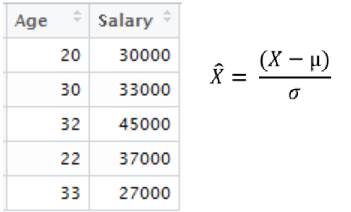

In [222]:
Image(filename='Image/kmeans.png')

- **Standardization Samples**:  

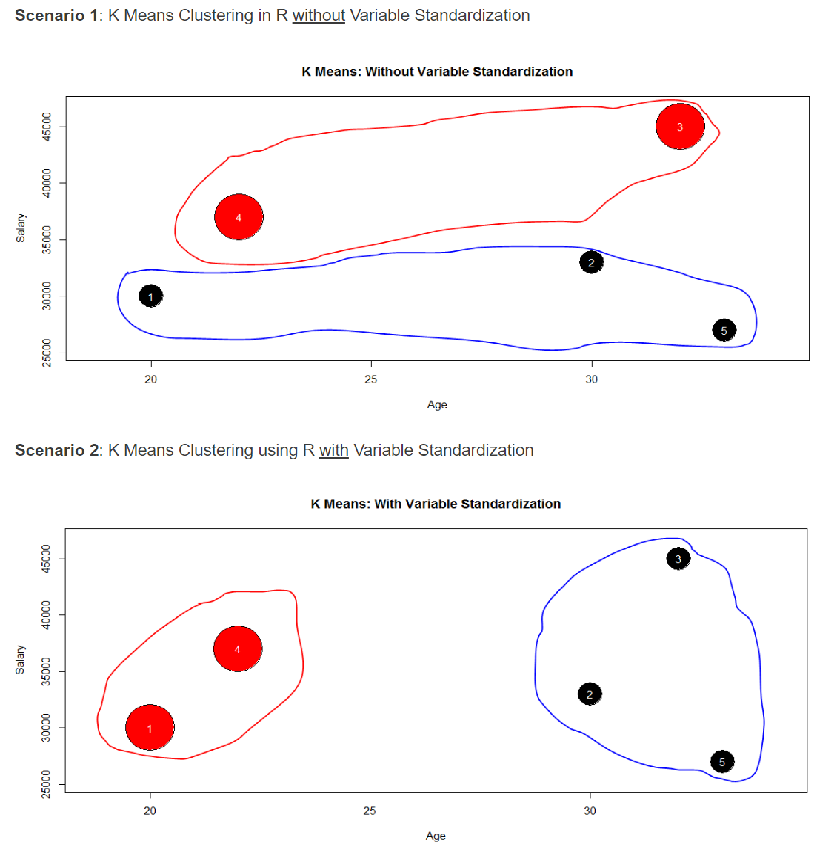

In [224]:
Image(filename='Image/kmeans1.png')

### 9. Principle Component Analysis (PCA):

- Nice tutorial: https://www.youtube.com/watch?v=FgakZw6K1QQ

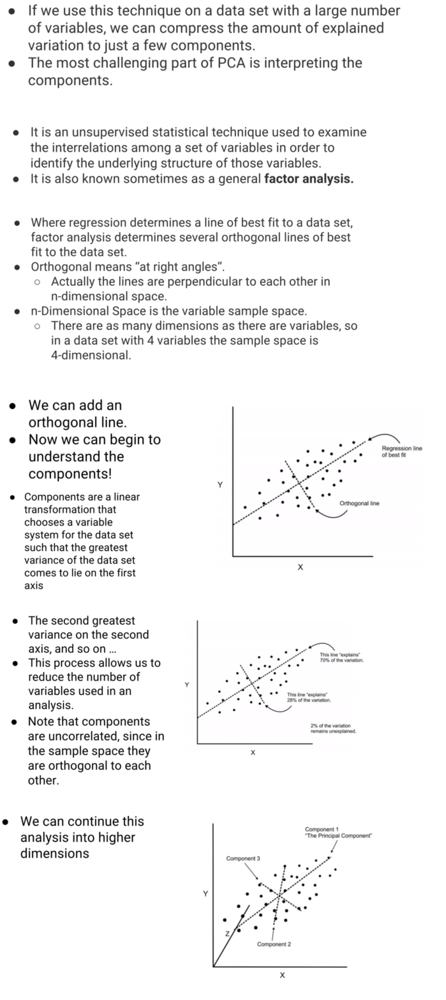

In [226]:
Image(filename='Image/PCA0.png')

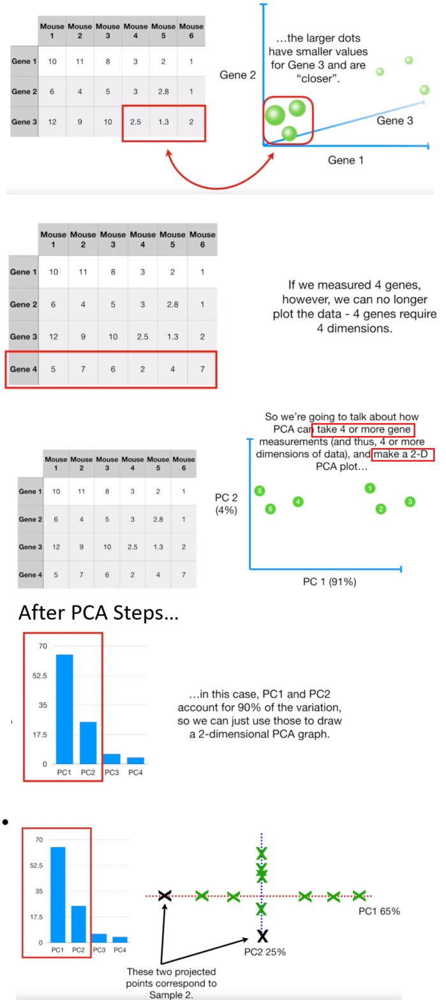

In [227]:
Image(filename='Image/PCA3.png')

#### 9.1 PCA Example:

In [231]:
from sklearn.datasets import load_breast_cancer

In [232]:
cancer=load_breast_cancer()
cancer.keys()

dict_keys(['data', 'target', 'target_names', 'DESCR', 'feature_names', 'filename'])

In [233]:
print(cancer['DESCR'])

.. _breast_cancer_dataset:

Breast cancer wisconsin (diagnostic) dataset
--------------------------------------------

**Data Set Characteristics:**

    :Number of Instances: 569

    :Number of Attributes: 30 numeric, predictive attributes and the class

    :Attribute Information:
        - radius (mean of distances from center to points on the perimeter)
        - texture (standard deviation of gray-scale values)
        - perimeter
        - area
        - smoothness (local variation in radius lengths)
        - compactness (perimeter^2 / area - 1.0)
        - concavity (severity of concave portions of the contour)
        - concave points (number of concave portions of the contour)
        - symmetry 
        - fractal dimension ("coastline approximation" - 1)

        The mean, standard error, and "worst" or largest (mean of the three
        largest values) of these features were computed for each image,
        resulting in 30 features.  For instance, field 3 is Mean Radius, f

In [236]:
print(cancer['data'])

[[1.799e+01 1.038e+01 1.228e+02 ... 2.654e-01 4.601e-01 1.189e-01]
 [2.057e+01 1.777e+01 1.329e+02 ... 1.860e-01 2.750e-01 8.902e-02]
 [1.969e+01 2.125e+01 1.300e+02 ... 2.430e-01 3.613e-01 8.758e-02]
 ...
 [1.660e+01 2.808e+01 1.083e+02 ... 1.418e-01 2.218e-01 7.820e-02]
 [2.060e+01 2.933e+01 1.401e+02 ... 2.650e-01 4.087e-01 1.240e-01]
 [7.760e+00 2.454e+01 4.792e+01 ... 0.000e+00 2.871e-01 7.039e-02]]


**In this dataset which has 30 features in it, it is hard to plot. Thus, reducing it by PCA into k<30(1,2,3) dimensions will help a lot.**

- Convert to dataframe

In [237]:
df=pd.DataFrame(data=cancer['data'], columns=cancer['feature_names'])

- Standardization:

In [238]:
from sklearn.preprocessing import StandardScaler

In [239]:
scaler = StandardScaler()
scaler.fit(df)

In [240]:
scaler_data=scaler.transform(df)

In [249]:
scaler_data.shape #Before PCA

(569, 30)

- PCA training and transform

In [241]:
from sklearn.decomposition import PCA

In [242]:
pca=PCA(n_components=2)

In [243]:
pca.fit(scaler_data)

PCA(copy=True, iterated_power='auto', n_components=2, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [244]:
x_pca=pca.transform(scaler_data)

In [247]:
x_pca

array([[ 9.19283683,  1.94858307],
       [ 2.3878018 , -3.76817174],
       [ 5.73389628, -1.0751738 ],
       ...,
       [ 1.25617928, -1.90229671],
       [10.37479406,  1.67201011],
       [-5.4752433 , -0.67063679]])

In [248]:
x_pca.shape #After PCA

(569, 2)

- Plot after PCA

Text(0, 0.5, '2nd Primary component')

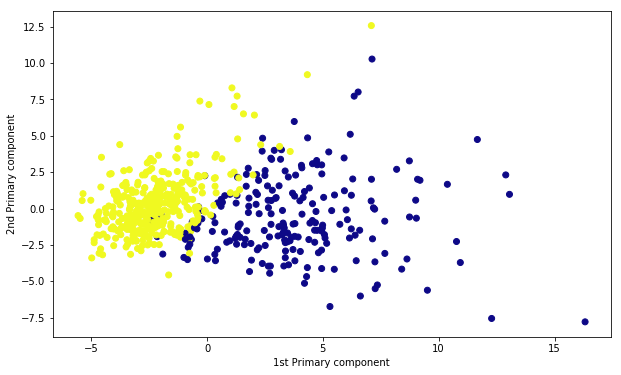

In [250]:
plt.figure(figsize=(10,6))
plt.scatter(x_pca[:,0], x_pca[:,1], c=cancer['target'], cmap='plasma')
plt.xlabel('1st Primary component')
plt.ylabel('2nd Primary component')

In [251]:
pca.components_

array([[ 0.21890244,  0.10372458,  0.22753729,  0.22099499,  0.14258969,
         0.23928535,  0.25840048,  0.26085376,  0.13816696,  0.06436335,
         0.20597878,  0.01742803,  0.21132592,  0.20286964,  0.01453145,
         0.17039345,  0.15358979,  0.1834174 ,  0.04249842,  0.10256832,
         0.22799663,  0.10446933,  0.23663968,  0.22487053,  0.12795256,
         0.21009588,  0.22876753,  0.25088597,  0.12290456,  0.13178394],
       [-0.23385713, -0.05970609, -0.21518136, -0.23107671,  0.18611302,
         0.15189161,  0.06016536, -0.0347675 ,  0.19034877,  0.36657547,
        -0.10555215,  0.08997968, -0.08945723, -0.15229263,  0.20443045,
         0.2327159 ,  0.19720728,  0.13032156,  0.183848  ,  0.28009203,
        -0.21986638, -0.0454673 , -0.19987843, -0.21935186,  0.17230435,
         0.14359317,  0.09796411, -0.00825724,  0.14188335,  0.27533947]])

**PC(Primary Component): the combination of the features:**
        - **Columns**: Original Features;
        - **Rows**: the primary component with combinations.

In [253]:
df_comp=pd.DataFrame(pca.components_, columns=cancer['feature_names'])
df_comp

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,0.218902,0.103725,0.227537,0.220995,0.142590,0.239285,0.258400,0.260854,0.138167,0.064363,...,0.227997,0.104469,0.236640,0.224871,0.127953,0.210096,0.228768,0.250886,0.122905,0.131784
1,-0.233857,-0.059706,-0.215181,-0.231077,0.186113,0.151892,0.060165,-0.034768,0.190349,0.366575,...,-0.219866,-0.045467,-0.199878,-0.219352,0.172304,0.143593,0.097964,-0.008257,0.141883,0.275339


- Plot the PCA datasets:

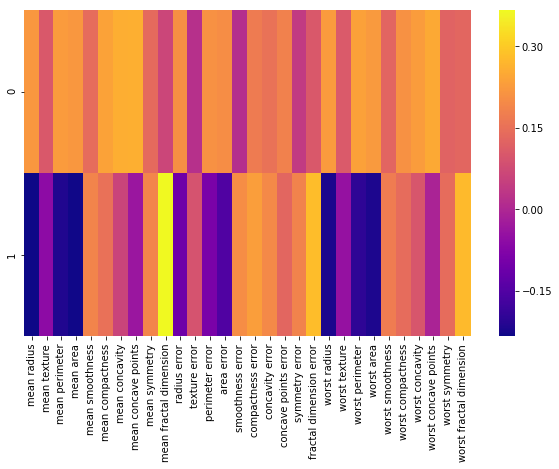

In [255]:
plt.figure(figsize=(10,6))
sns.heatmap(df_comp, cmap='plasma')

**Note:  Logistic Regression could be used on the Datasets after Standarization & PCA, rather than the original data.**

### The whole pipeline:

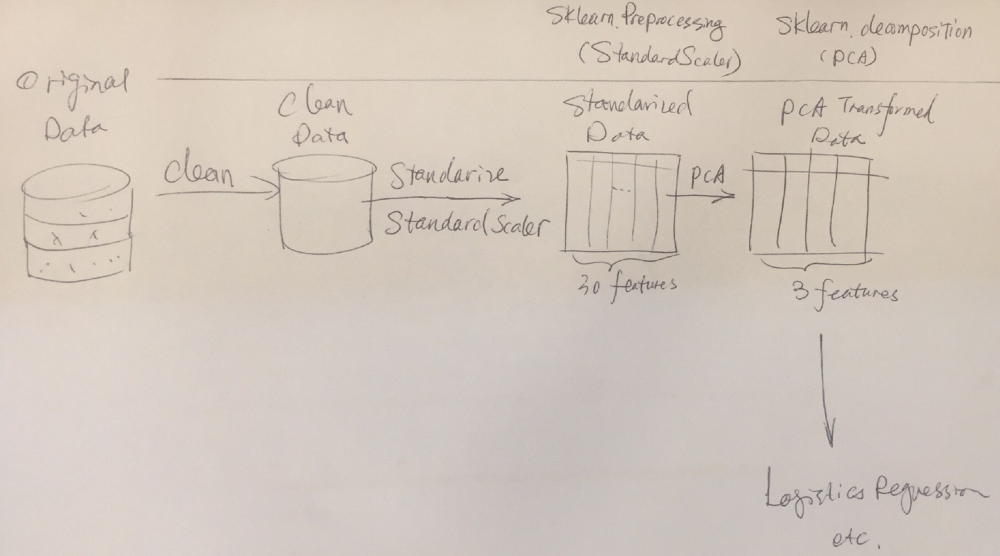

In [256]:
Image(filename='Image/pipeline.png')

### 10. Recommender System:

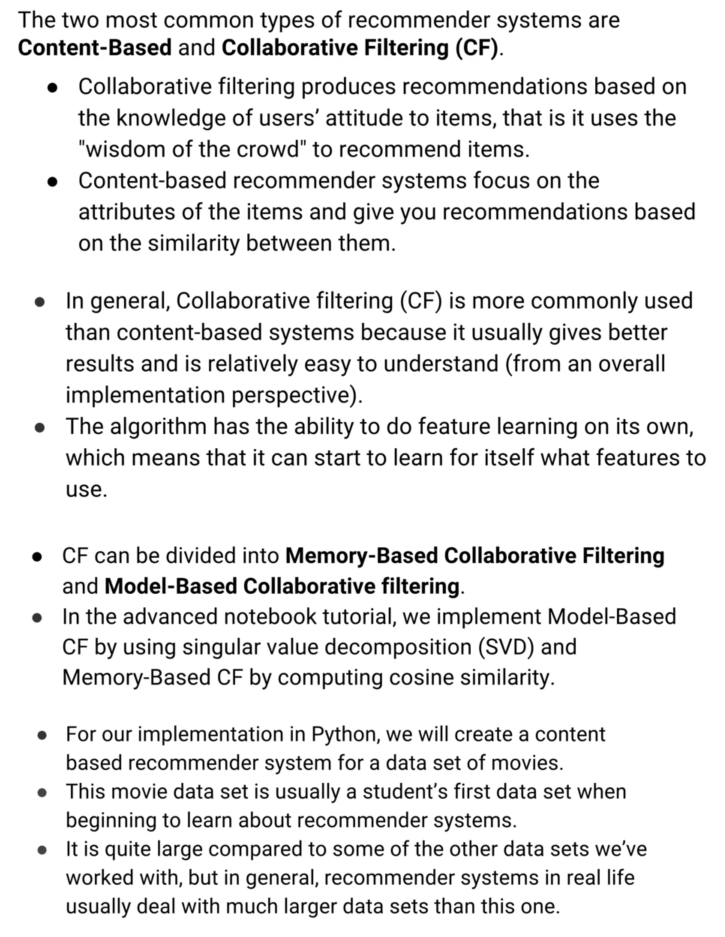

In [257]:
Image(filename='Image/rs.png')

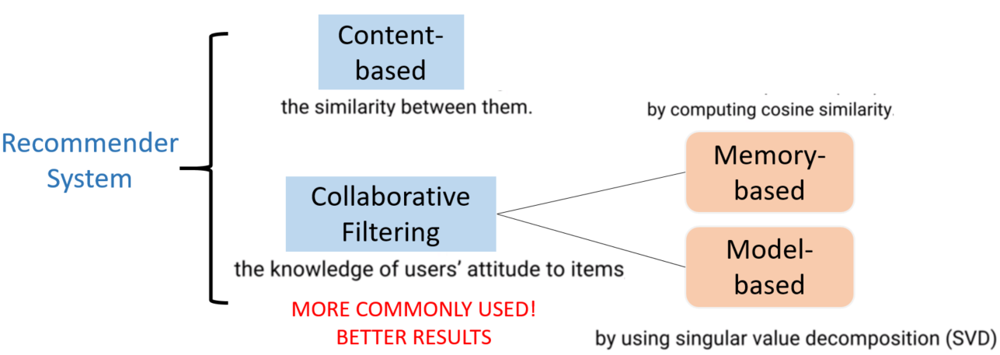

In [258]:
Image(filename='Image/rsst.png')

### 11. Natural Language Processing:

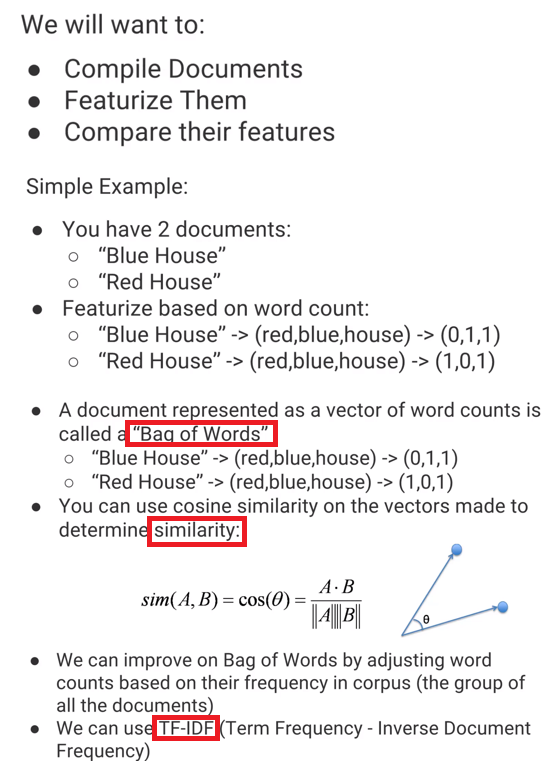

In [9]:
Image(filename='Image/nlp1.png')

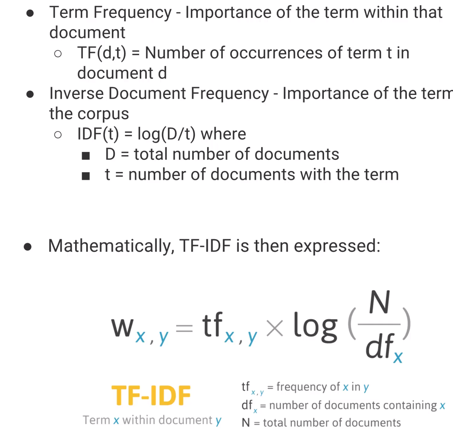

In [8]:
Image(filename='Image/nlp2.png')

### NLP Example:

In [2]:
import nltk
import numpy as np
import pandas as pd

In [6]:
nltk.download_shell()
#Download stopwords etc. corpus

NLTK Downloader
---------------------------------------------------------------------------
    d) Download   l) List    u) Update   c) Config   h) Help   q) Quit
---------------------------------------------------------------------------
Downloader> q


#### Step1: Check the data by open:

In [84]:
msgs = [line.rstrip() for line in open('Data/smsspamcollection/SMSSpamCollection', 'rb')]
#'rb': On Windows, 'b' appended to the mode opens the file in binary mode, so there are also modes like 'rb', 'wb', and 'r+b'. Python on Windows makes a distinction between text and binary files;
#'rstrip()': Returns a copy of the string with trailing characters removed.

In [85]:
print(len(msgs))

5574


In [86]:
for msg in enumerate (msgs[:10]):
    print(mess_no, msg)
    print('\n')

9 (0, b'ham\tGo until jurong point, crazy.. Available only in bugis n great world la e buffet... Cine there got amore wat...')


9 (1, b'ham\tOk lar... Joking wif u oni...')


9 (2, b"spam\tFree entry in 2 a wkly comp to win FA Cup final tkts 21st May 2005. Text FA to 87121 to receive entry question(std txt rate)T&C's apply 08452810075over18's")


9 (3, b'ham\tU dun say so early hor... U c already then say...')


9 (4, b"ham\tNah I don't think he goes to usf, he lives around here though")


9 (5, b"spam\tFreeMsg Hey there darling it's been 3 week's now and no word back! I'd like some fun you up for it still? Tb ok! XxX std chgs to send, \xc2\xa31.50 to rcv")


9 (6, b'ham\tEven my brother is not like to speak with me. They treat me like aids patent.')


9 (7, b"ham\tAs per your request 'Melle Melle (Oru Minnaminunginte Nurungu Vettam)' has been set as your callertune for all Callers. Press *9 to copy your friends Callertune")


9 (8, b'spam\tWINNER!! As a valued network customer you ha

In [87]:
for mess_no, msg in enumerate (msgs[:10]):
    print(mess_no, msg)
    print('\n')

0 b'ham\tGo until jurong point, crazy.. Available only in bugis n great world la e buffet... Cine there got amore wat...'


1 b'ham\tOk lar... Joking wif u oni...'


2 b"spam\tFree entry in 2 a wkly comp to win FA Cup final tkts 21st May 2005. Text FA to 87121 to receive entry question(std txt rate)T&C's apply 08452810075over18's"


3 b'ham\tU dun say so early hor... U c already then say...'


4 b"ham\tNah I don't think he goes to usf, he lives around here though"


5 b"spam\tFreeMsg Hey there darling it's been 3 week's now and no word back! I'd like some fun you up for it still? Tb ok! XxX std chgs to send, \xc2\xa31.50 to rcv"


6 b'ham\tEven my brother is not like to speak with me. They treat me like aids patent.'


7 b"ham\tAs per your request 'Melle Melle (Oru Minnaminunginte Nurungu Vettam)' has been set as your callertune for all Callers. Press *9 to copy your friends Callertune"


8 b'spam\tWINNER!! As a valued network customer you have been selected to receivea \xc2\xa3900 pri

In [88]:
msgs[0]

b'ham\tGo until jurong point, crazy.. Available only in bugis n great world la e buffet... Cine there got amore wat...'

#### Step2: Read the message from csv:

In [89]:
msgs=pd.read_csv('Data/smsspamcollection/SMSSpamCollection', sep='\t', names=['label', 'message'])

In [90]:
msgs.describe()

,label,message
count,5572,5572
unique,2,5169
top,ham,"Sorry, I'll call later"
freq,4825,30


In [91]:
msgs.groupby('label').describe()

message                                                               
        count unique                                                top freq
label                                                                       
ham      4825   4516                             Sorry, I'll call later   30
spam      747    653  Please call our customer service representativ...    4

In [92]:
msgs['length']=msgs['message'].apply(len)

In [93]:
msgs.head(3)

,label,message,length
0,ham,"Go until jurong point, crazy.. Available only ...",111
1,ham,Ok lar... Joking wif u oni...,29
2,spam,Free entry in 2 a wkly comp to win FA Cup fina...,155


In [94]:
msgs.groupby('length').describe()

label                  message         \
       count unique  top freq   count unique   
length                                         
2          4      1  ham    4       4      1   
3          8      1  ham    8       8      4   
4          6      1  ham    6       6      3   
5         11      1  ham   11      11      2   
6          3      1  ham    3       3      3   
7         10      1  ham   10      10      7   
8          5      1  ham    5       5      5   
9          9      1  ham    9       9      6   
10         4      1  ham    4       4      4   
11         7      1  ham    7       7      6   
12         5      1  ham    5       5      5   
13        11      2  ham   10      11     11   
14        10      1  ham   10      10      9   
15        13      1  ham   13      13     13   
16         6      1  ham    6       6      6   
17        13      1  ham   13      13     13   
18        13      2  ham   12      13     13   
19        17      1  ham   17      17     17   
20        11      1  ham   11      11     11   
21        19      1  ham   19      19     19   
22       120      1  ham  120     120     88   
23        95      1  ham   95      95     87   
24        99      2  ham   98      99     90   
25        85      1  ham   85      85     82   
26        85      1  ham   85      85     79   
27        80      1  ham   80      80     74   
28        87      1  ham   87      87     77   
29        78      1  ham   78      78     75   
30        76      2  ham   75      76     75   
31        78      1  ham   78      78     77   
...      ...    ...  ...  ...     ...    ...   
306        1      1  ham    1       1      1   
316        2      1  ham    2       2      1   
320        1      1  ham    1       1      1   
322        1      1  ham    1       1      1   
324        3      1  ham    3       3      1   
327        2      1  ham    2       2      2   
329        3      1  ham    3       3      2   
332        1      1  ham    1       1      1   
338        1      1  ham    1       1      1   
350        1      1  ham    1       1      1   
363        1      1  ham    1       1      1   
368        1      1  ham    1       1      1   
372        1      1  ham    1       1      1   
375        1      1  ham    1       1      1   
379        1      1  ham    1       1      1   
382        1      1  ham    1       1      1   
384        1      1  ham    1       1      1   
408        1      1  ham    1       1      1   
415        1      1  ham    1       1      1   
431        1      1  ham    1       1      1   
444        3      1  ham    3       3      1   
446        2      1  ham    2       2      1   
458        1      1  ham    1       1      1   
461        1      1  ham    1       1      1   
482        1      1  ham    1       1      1   
588        2      1  ham    2       2      1   
611        1      1  ham    1       1      1   
629        1      1  ham    1       1      1   
790        1      1  ham    1       1      1   
910        1      1  ham    1       1      1   

                                                                
                                                      top freq  
length                                                          
2                                                      Ok    4  
3                                                     Ok.    4  
4                                                    Okie    4  
5                                                   Ok...   10  
6                                                  Yup...    1  
7                                                 Okie...    3  
8                                                My phone    1  
9                                               Ok lor...    3  
10                                             Anytime...    1  
11                                            Ok thanx...    2  
12                                           Huh y lei...    1  
13                      

#### Step3: plot:

- Check the length of length distribution:

In [95]:
from matplotlib import pyplot as plt
import seaborn as sns

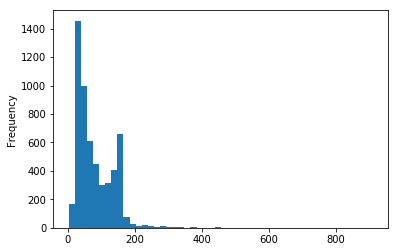

In [96]:
msgs['length'].plot.hist(bins=50)

- Check the 'Outlier' with more than 400 words:

In [97]:
msgs[msgs['length']>400]['message'].iloc[0]

"For me the love should start with attraction.i should feel that I need her every time around me.she should be the first thing which comes in my thoughts.I would start the day and end it with her.she should be there every time I dream.love will be then when my every breath has her name.my life should happen around her.my life will be named to her.I would cry for her.will give all my happiness and take all her sorrows.I will be ready to fight with anyone for her.I will be in love when I will be doing the craziest things for her.love will be when I don't have to proove anyone that my girl is the most beautiful lady on the whole planet.I will always be singing praises for her.love will be when I start up making chicken curry and end up makiing sambar.life will be the most beautiful then.will get every morning and thank god for the day because she is with me.I would like to say a lot..will tell later.."

array([<matplotlib.axes._subplots.AxesSubplot object at 0x000001BA6A133080>,
      dtype=object)

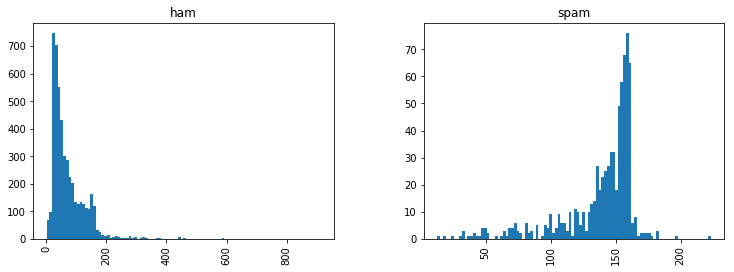

In [98]:
msgs.hist(column='length', by='label', bins=100, figsize=(12,4))
# hist(by=...): sperate the plots by 'by'

- we've been able to discover a trend that spam messages tend to have more characters. 

#### Step4: Text Pre-processing

Terms:  
    - Corpora: Body of text.
    - Lexicon: 'Dictionary':Words & its meaning.
    - Tokenize: Split a line into word-length pieces
    - bag-of-words: 

In [99]:
import string

In [100]:
mess='Sample message! Notice: it has punctuation.'
string.punctuation

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

In [101]:
#nopunc=[char for char in mess if char not in string.punctuation]
#nopunc[:10]

In [102]:
#test=''.join(nopunc)
#print(test)

#### Step1: Pre-process:

- Import stopwords:

In [103]:
from nltk.corpus import stopwords

In [104]:
stopwords.words('english')[:10]

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're"]

- Tokenize: Clean the punctuations and split the words. 

In [105]:
def text_process(mess):
    nopunc=[char for char in mess if char not in string.punctuation]
    nopunc=''.join(nopunc) #Connect the chars with '' to Clean the punctuations from mess--TOKENIZE
    return [word for word in nopunc.split() if word.lower() not in stopwords.words('english')]

In [106]:
msgs['message'].head(5)

0    Go until jurong point, crazy.. Available only ...
1                        Ok lar... Joking wif u oni...
2    Free entry in 2 a wkly comp to win FA Cup fina...
3    U dun say so early hor... U c already then say...
4    Nah I don't think he goes to usf, he lives aro...
Name: message, dtype: object

- Apply the tokenize function to the text:

- CountVectorize: Convert each of those messages into a vector the SciKit 

We'll convert each message, represented as a list of tokens (lemmas) above, into a vector that machine learning models can understand:  

Do that in 3 steps using the bag-of-words model:  

1. Count how many times does a word occur in each message (Known as term frequency)  

2. Weigh the counts, so that frequent tokens get lower weight (inverse document frequency)  

3. Normalize the vectors to unit length, to abstract from the original text length (L2 norm)

- Each vector will have as many dimensions as there are unique words in the SMS corpus.  
We will first use **SciKit Learn's CountVectorizer**.  
This model will convert a collection of text documents to a matrix of token counts.  
  
We can imagine this as a 2-Dimensional matrix:  
1. Where the 1-dimension is the entire vocabulary (1 row per word);  
2. The other dimension are the actual documents, in this case a column per text message. 

For example:

<table border = “1“>
<tr>
<th></th> <th>Message 1</th> <th>Message 2</th> <th>...</th> <th>Message N</th> 
</tr>
<tr>
<td><b>Word 1 Count</b></td><td>0</td><td>1</td><td>...</td><td>0</td>
</tr>
<tr>
<td><b>Word 2 Count</b></td><td>0</td><td>0</td><td>...</td><td>0</td>
</tr>
<tr>
<td><b>...</b></td> <td>1</td><td>2</td><td>...</td><td>0</td>
</tr>
<tr>
<td><b>Word N Count</b></td> <td>0</td><td>1</td><td>...</td><td>1</td>
</tr>
</table>

In [107]:
from sklearn.feature_extraction.text import CountVectorizer

- There are a lot of arguments and parameters that can be passed to the CountVectorizer. In this case we will just specify the **analyzer** to be our own previously defined function:

In [109]:
bow_transformer=CountVectorizer(analyzer=text_process).fit(msgs['message'])
print(len(bow_transformer.vocabulary_))

11425


In [110]:
type(bow_transformer)

sklearn.feature_extraction.text.CountVectorizer

- Let's take one text message and get its bag-of-words counts as a vector, putting to use our new bow_transformer:

In [111]:
mess4=msgs['message'][3]
mess4

'U dun say so early hor... U c already then say...'

- Now let's see its vector representation:

In [112]:
bow4=bow_transformer.transform([mess4])
print(bow4)

  (0, 4068)	2
  (0, 4629)	1
  (0, 5261)	1
  (0, 6204)	1
  (0, 6222)	1
  (0, 7186)	1
  (0, 9554)	2


- This means that there are seven unique words in message number 4 (after removing common stop words).  
- Two of them appear twice, the rest only once. Let's go ahead and check and confirm which ones appear twice:

In [113]:
print(bow_transformer.get_feature_names()[4068])
print(bow_transformer.get_feature_names()[9554])

U
say
